# Imports

In [1]:
from pandas import read_csv
from matplotlib import pyplot as plt
import sys
import numpy as np
import pandas as pd
from datetime import datetime

from sklearn.model_selection import train_test_split
from tensorflow import keras
from tensorflow.keras import layers
from keras.optimizers import Adam
from keras.layers import MaxPooling2D,Activation, Dense
from tensorflow import Tensor
from tensorflow.keras.layers import Input, Conv1D, Conv2D, ReLU, BatchNormalization,\
                                    Add, AveragePooling2D, Flatten, Dense,Dropout,LSTM,TimeDistributed,\
                                    MaxPooling1D,Flatten
from tensorflow.keras.models import Model
from keras.models import Sequential
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Variáveis Globais

In [2]:
file_path = "C:\\Users\\lopes\\Desktop\\Apple watch\\Exercicio"

users1=["AntonioC","GusC","DarC"]

repetition=["R1","R2","R3","R4"]

pesos=["3kg","5kg"]

# Funções Definidas

In [6]:
def getMedian(vs):
    if (len(vs)==0):
        return 0
    return (np.median(vs))

In [7]:
def getMatrix(exer, file_path, users1,repetition, pesos):
        X = []
        Y = []
        CV_Pesos = []
        CV_Utilizadores = []
        CV_Repeticao = []
        CV_Individual = []
        Contagem = 0
        tW=list(np.arange(-2.5,2.5+0.125,0.1))
        tStep=0.1
        for ixa,ps in enumerate(pesos):
                for ixu,us in enumerate(users1):
                    for ixc,cl in enumerate(repetition):
                        print("Scene ", Contagem)
                        print("the user user is ",us," try nº ",cl," peso: ",ps)
                        data_input = pd.read_csv(file_path+exer+"\\"+us+exer+"_"+cl+"_"+ps+".txt", skiprows=1, header=None, sep='\s+',
                                                 names=["TimeStep","Dias","Segundos","XACC","YACC","ZACC","XGYR","YGYR","ZGYR"])
                        tMax_input= data_input["Segundos"].iloc[-1]
                        data_output = pd.read_excel(file_path+exer+"\\"+us+exer+"_"+cl+"_"+ps+".xlsx",header=0,sheet_name='Serie 1')
                        tMax_output = data_output["Tiempo (s)"].iloc[-1]
                        offset_scene = float(open(file_path+exer+"\\"+us+exer+"_"+cl+"_"+ps+".txt").readline().split('=')[1])
                        print("Offset Inicial = ",offset_scene)

                        print("Tempo Input = ",tMax_input," Tempo Output = ",tMax_output)
                        tMaxMin=min(tMax_input,tMax_output)

                        for t in np.arange(0-min(tW),tMaxMin-max(tW),tStep):
                            xi=[]
                            yi=[]

                            xi1=[]
                            xi2=[]
                            xi3=[]
                            xi4=[]
                            xi5=[]
                            xi6=[]
                            Tempos = []
                            for it in range(0,len(tW)-2,1): #len = 50

                                    tr=t

                                    t0=tr+tW[it]
                                    tN=tr+tW[it+1]
                                    ag1=data_input.iloc[np.where((data_input["Segundos"] >= t0+offset_scene ) & (data_input["Segundos"] <=  tN+offset_scene))]

                                    Tempos.append(t0)
                                    Tempos.append(tN)

                                    xi1.append(getMedian(ag1.iloc[:,3]))
                                    xi2.append(getMedian(ag1.iloc[:,4]))
                                    xi3.append(getMedian(ag1.iloc[:,5]))
                                    xi4.append(getMedian(ag1.iloc[:,6]))
                                    xi5.append(getMedian(ag1.iloc[:,7]))
                                    xi6.append(getMedian(ag1.iloc[:,8]))

                            ag2=data_output.iloc[np.where((data_output["Tiempo (s)"] >= Tempos[0]) & (data_output["Tiempo (s)"] <=  Tempos[1]))]

                            xi.append(xi1)
                            xi.append(xi2)
                            xi.append(xi3)
                            xi.append(xi4)
                            xi.append(xi5)
                            xi.append(xi6)
                            yi.append(getMedian(ag2.iloc[:,5]))

                            # list of len 6,51 --> [[ACCX],[ACCY],[ACCZ],[GYRX],[GYRY],[GYRZ]]
                            X.append(np.transpose(xi))
                            Y.append(np.transpose(yi))
                            CV_Pesos.append(ixa)
                            CV_Utilizadores.append(ixu)
                            CV_Repeticao.append(ixc)
                            CV_Individual.append(Contagem)

                        Contagem += 1
                        print("----------------------------------")
                                                    #                            it = 49              """             it = 0
        X=np.array(X)                               #matrix t=1   [[ACCX,ACCY,ACCZ,GYRX,GYRX,GYRX],          , [ACCX,ACCY,ACCZ,GYRX,GYRX,GYRX]]
        Y=np.array(Y)                               #       """
        CV_Pesos = np.array(CV_Pesos)               #       t=max [[ACCX,ACCY,ACCZ,GYRX,GYRX,GYRX],          , [ACCX,ACCY,ACCZ,GYRX,GYRX,GYRX]]
        CV_Utilizadores = np.array(CV_Utilizadores)
        CV_Repeticao = np.array(CV_Repeticao)
        CV_Individual = np.array(CV_Individual)

        print(X.shape,Y.shape,CV_Pesos.shape,CV_Utilizadores.shape,CV_Repeticao.shape,CV_Individual.shape)

        return X,Y,CV_Pesos,CV_Utilizadores,CV_Repeticao, CV_Individual

In [8]:
def ResultadosRegressao(X,Y,S):
        for ixs,sc in enumerate(np.unique(S)):

            train_index=np.where(S != sc)[0]
            test_index=np.where(S == sc)[0]

            np.random.shuffle(train_index)

            print("SCENE", sc, " TRAIN:", train_index, " TEST:", test_index)
            x_train, x_val = np.copy(X[train_index]), np.copy(X[test_index])
            y_train, y_val = np.copy(Y[train_index]), np.copy(Y[test_index])

            #min_v=min(x_train[:,:,0].flatten())
            for ixv in range(0,X.shape[2]):
                min_v=min(x_train[:,:,ixv].flatten())
                max_v=max(x_train[:,:,ixv].flatten())
                x_train[:,:,ixv]=(x_train[:,:,ixv]-min_v)/(max_v-min_v)
                x_val[:,:,ixv]=(x_val[:,:,ixv]-min_v)/(max_v-min_v)

            min_v=min(y_train)
            max_v=max(y_train)

            y_train=(y_train-min_v)/(max_v-min_v)
            y_val=(y_val-min_v)/(max_v-min_v)

            model = Sequential([
                Input(shape=(X.shape[1], X.shape[2])),  # Explicit Input layer
                Conv1D(filters=16, kernel_size=2, activation='relu'),
                Conv1D(filters=32, kernel_size=3, activation='relu'),
                Dropout(0.25),
                Conv1D(filters=64, kernel_size=3, activation='relu'),
                Conv1D(filters=128, kernel_size=3, activation='relu'),
                Dropout(0.25),
                LSTM(256, return_sequences=True),
                Dropout(0.25),
                LSTM(256),
                Flatten(),
                Dense(2048, activation='relu'),
                Dense(1024, activation='relu'),
                Dense(1, activation="sigmoid")
            ])

            model.compile(optimizer='adam', loss='mae')

            history = model.fit(x_train, y_train, batch_size=16, epochs=30, validation_data=(x_val, y_val)) #mudar epochs para 30

            y_pred = model.predict(x_val)

            mse = mean_squared_error(y_val, y_pred)
            mae = mean_absolute_error(y_val, y_pred)
            rmse = np.sqrt(mse)
            r2 = r2_score(y_val, y_pred)

            print("Evaluation Metrics for Regression Model:")
            print(f"Mean Squared Error (MSE): {mse}")
            print(f"Mean Absolute Error (MAE): {mae}")
            print(f"Root Mean Squared Error (RMSE): {rmse}")
            print(f"R-squared: {r2}")

            y_pred=y_pred*(max_v-min_v)+min_v
            y_val=y_val*(max_v-min_v)+min_v

            indices = range(1, len(y_pred) + 1)

            plt.figure(figsize=(10, 10))
            plt.plot(indices, y_pred, '-', label='Predicted')
            plt.plot(indices, y_val, '--', label='Actual')
            plt.xlabel('Index')
            plt.ylabel('Values')
            plt.title('Predicted vs. Actual')
            plt.grid(True, which='both', axis='x')
            plt.legend()
            plt.show()


In [9]:
exer="3"
Resultados3Matrix = getMatrix(exer, file_path, users1,repetition, pesos)

Scene  0
the user user is  AntonioC  try nº  R1  peso:  3kg
Offset Inicial =  2.3499999999999917
Tempo Input =  35.499  Tempo Output =  31.994
----------------------------------
Scene  1
the user user is  AntonioC  try nº  R2  peso:  3kg
Offset Inicial =  1.8499999999999934
Tempo Input =  35.611  Tempo Output =  32.667
----------------------------------
Scene  2
the user user is  AntonioC  try nº  R3  peso:  3kg
Offset Inicial =  1.7999999999999936
Tempo Input =  35.192  Tempo Output =  32.097
----------------------------------
Scene  3
the user user is  AntonioC  try nº  R4  peso:  3kg
Offset Inicial =  1.7499999999999938
Tempo Input =  34.395  Tempo Output =  31.422
----------------------------------
Scene  4
the user user is  GusC  try nº  R1  peso:  3kg
Offset Inicial =  0.6999999999999975
Tempo Input =  31.16  Tempo Output =  29.148
----------------------------------
Scene  5
the user user is  GusC  try nº  R2  peso:  3kg
Offset Inicial =  0.8999999999999968
Tempo Input =  31.338 

# Exercicio 3 Cross Validation Pesos

SCENE 0  TRAIN: [5094 4711 4864 ... 3034 4973 4794]  TEST: [   0    1    2 ... 2856 2857 2858]
Epoch 1/30
168/168 [==============================] - 24s 126ms/step - loss: 0.1597 - val_loss: 0.1174
Epoch 2/30
168/168 [==============================] - 19s 116ms/step - loss: 0.1097 - val_loss: 0.1062
Epoch 3/30
168/168 [==============================] - 25s 151ms/step - loss: 0.0809 - val_loss: 0.1116
Epoch 4/30
168/168 [==============================] - 23s 135ms/step - loss: 0.0659 - val_loss: 0.0483
Epoch 5/30
168/168 [==============================] - 23s 137ms/step - loss: 0.0536 - val_loss: 0.0444
Epoch 6/30
168/168 [==============================] - 22s 129ms/step - loss: 0.0519 - val_loss: 0.0434
Epoch 7/30
168/168 [==============================] - 22s 128ms/step - loss: 0.0533 - val_loss: 0.0490
Epoch 8/30
168/168 [==============================] - 22s 130ms/step - loss: 0.0481 - val_loss: 0.0455
Epoch 9/30
168/168 [==============================] - 22s 131ms/step - loss: 0.04

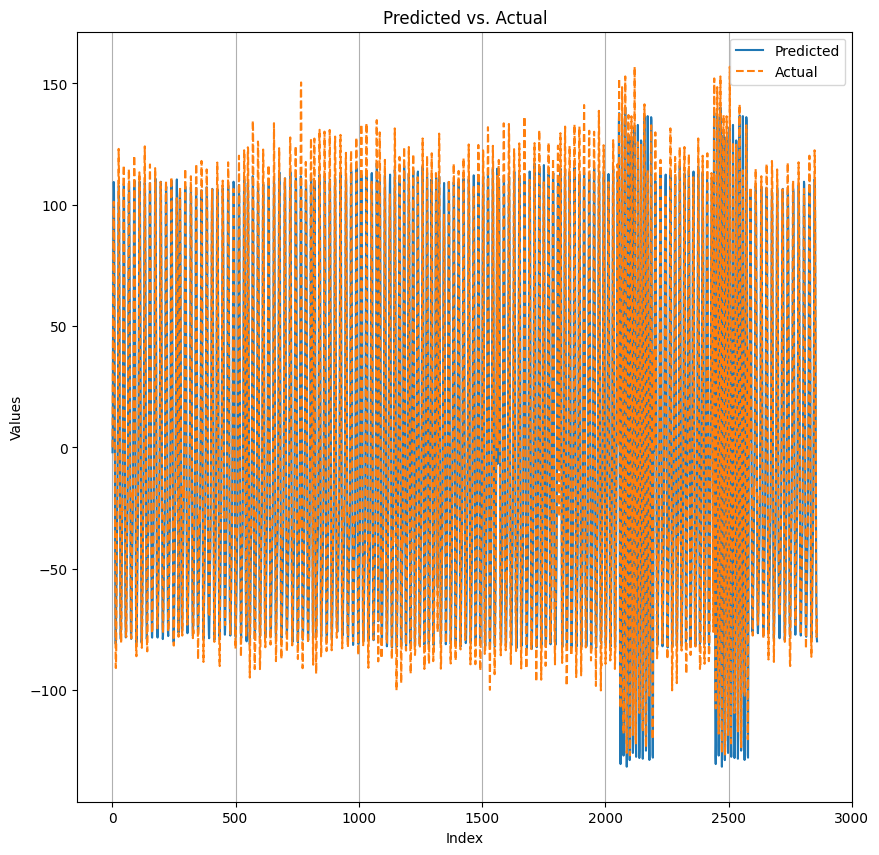

SCENE 1  TRAIN: [2090 1573 2819 ...  269 2350  117]  TEST: [2859 2860 2861 ... 5532 5533 5534]
Epoch 1/30
179/179 [==============================] - 133s 711ms/step - loss: 0.1281 - val_loss: 0.1511
Epoch 2/30
179/179 [==============================] - 96s 538ms/step - loss: 0.0933 - val_loss: 0.1611
Epoch 3/30
179/179 [==============================] - 75s 420ms/step - loss: 0.0734 - val_loss: 0.0974
Epoch 4/30
179/179 [==============================] - 98s 549ms/step - loss: 0.0626 - val_loss: 0.0840
Epoch 5/30
179/179 [==============================] - 99s 558ms/step - loss: 0.0615 - val_loss: 0.0832
Epoch 6/30
179/179 [==============================] - 79s 439ms/step - loss: 0.0564 - val_loss: 0.0841
Epoch 7/30
179/179 [==============================] - 88s 492ms/step - loss: 0.0526 - val_loss: 0.0667
Epoch 8/30
179/179 [==============================] - 70s 391ms/step - loss: 0.0539 - val_loss: 0.0730
Epoch 9/30
179/179 [==============================] - 72s 403ms/step - loss: 0.0

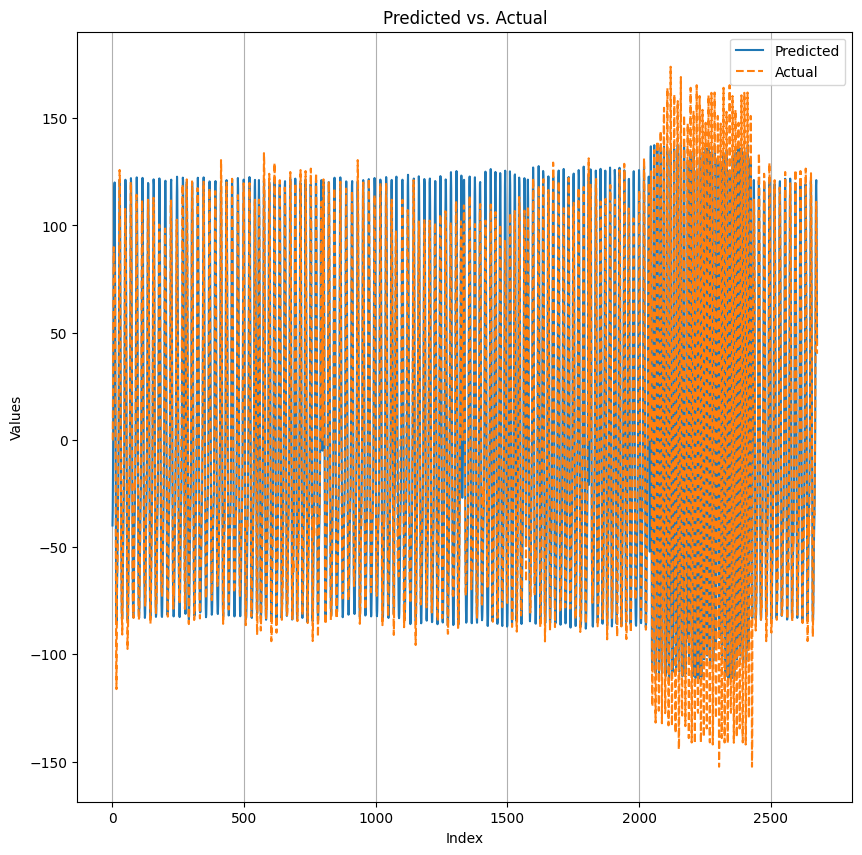

In [10]:
ResultadosRegressao(Resultados3Matrix[0],Resultados3Matrix[1],Resultados3Matrix[2])

# Exercicio 3 Cross Validation Utilizadores

SCENE 0  TRAIN: [1894 2548 2238 ... 4638 3722 3916]  TEST: [   0    1    2 ... 3696 3697 3698]
Epoch 1/30
183/183 [==============================] - 9s 22ms/step - loss: 0.1350 - val_loss: 0.1543
Epoch 2/30
183/183 [==============================] - 2s 12ms/step - loss: 0.0815 - val_loss: 0.0714
Epoch 3/30
183/183 [==============================] - 3s 14ms/step - loss: 0.0630 - val_loss: 0.0641
Epoch 4/30
183/183 [==============================] - 3s 17ms/step - loss: 0.0557 - val_loss: 0.0665
Epoch 5/30
183/183 [==============================] - 2s 13ms/step - loss: 0.0564 - val_loss: 0.1444
Epoch 6/30
183/183 [==============================] - 2s 12ms/step - loss: 0.0550 - val_loss: 0.0396
Epoch 7/30
183/183 [==============================] - 2s 13ms/step - loss: 0.0465 - val_loss: 0.0522
Epoch 8/30
183/183 [==============================] - 2s 12ms/step - loss: 0.0459 - val_loss: 0.0512
Epoch 9/30
183/183 [==============================] - 3s 16ms/step - loss: 0.0421 - val_loss: 0.0

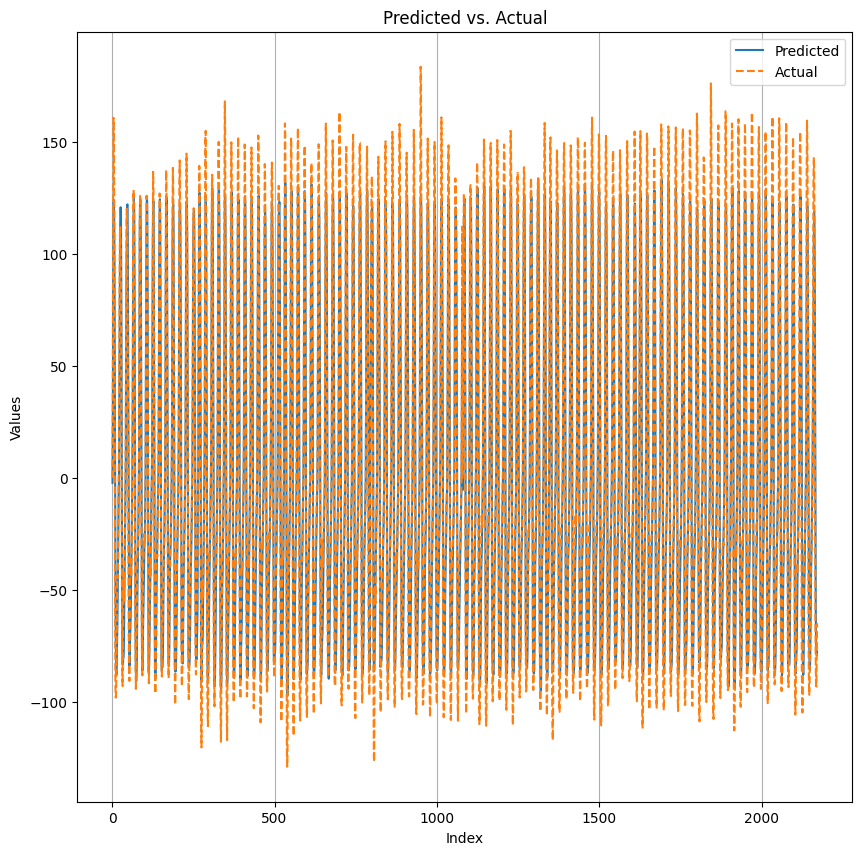

SCENE 1  TRAIN: [  39  405 2307 ...  109  963 3288]  TEST: [1078 1079 1080 ... 4568 4569 4570]
Epoch 1/30
205/205 [==============================] - 10s 23ms/step - loss: 0.1252 - val_loss: 0.1532
Epoch 2/30
205/205 [==============================] - 3s 13ms/step - loss: 0.0995 - val_loss: 0.0967
Epoch 3/30
205/205 [==============================] - 3s 13ms/step - loss: 0.0702 - val_loss: 0.0904
Epoch 4/30
205/205 [==============================] - 3s 13ms/step - loss: 0.0617 - val_loss: 0.0583
Epoch 5/30
205/205 [==============================] - 3s 14ms/step - loss: 0.0614 - val_loss: 0.0800
Epoch 6/30
205/205 [==============================] - 3s 17ms/step - loss: 0.0494 - val_loss: 0.0426
Epoch 7/30
205/205 [==============================] - 3s 13ms/step - loss: 0.0447 - val_loss: 0.0395
Epoch 8/30
205/205 [==============================] - 3s 13ms/step - loss: 0.0430 - val_loss: 0.0663
Epoch 9/30
205/205 [==============================] - 3s 13ms/step - loss: 0.0396 - val_loss: 0.

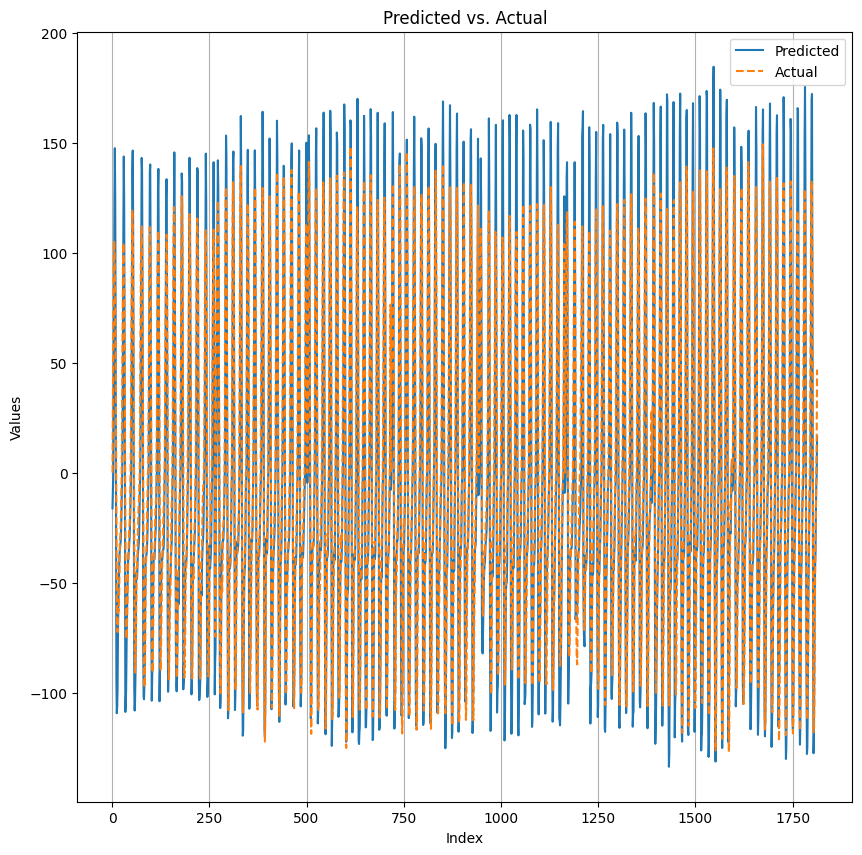

SCENE 2  TRAIN: [1434 1242  339 ... 3417 1613  313]  TEST: [2019 2020 2021 ... 5081 5082 5083]
Epoch 1/30
249/249 [==============================] - 8s 16ms/step - loss: 0.1323 - val_loss: 0.2801
Epoch 2/30
249/249 [==============================] - 3s 13ms/step - loss: 0.0704 - val_loss: 0.2949
Epoch 3/30
249/249 [==============================] - 4s 15ms/step - loss: 0.0620 - val_loss: 0.3030
Epoch 4/30
249/249 [==============================] - 3s 11ms/step - loss: 0.0505 - val_loss: 0.2548
Epoch 5/30
249/249 [==============================] - 3s 11ms/step - loss: 0.0480 - val_loss: 0.2405
Epoch 6/30
249/249 [==============================] - 3s 12ms/step - loss: 0.0480 - val_loss: 0.2075
Epoch 7/30
249/249 [==============================] - 3s 13ms/step - loss: 0.0478 - val_loss: 0.2145
Epoch 8/30
249/249 [==============================] - 4s 14ms/step - loss: 0.0438 - val_loss: 0.2098
Epoch 9/30
249/249 [==============================] - 3s 11ms/step - loss: 0.0419 - val_loss: 0.2

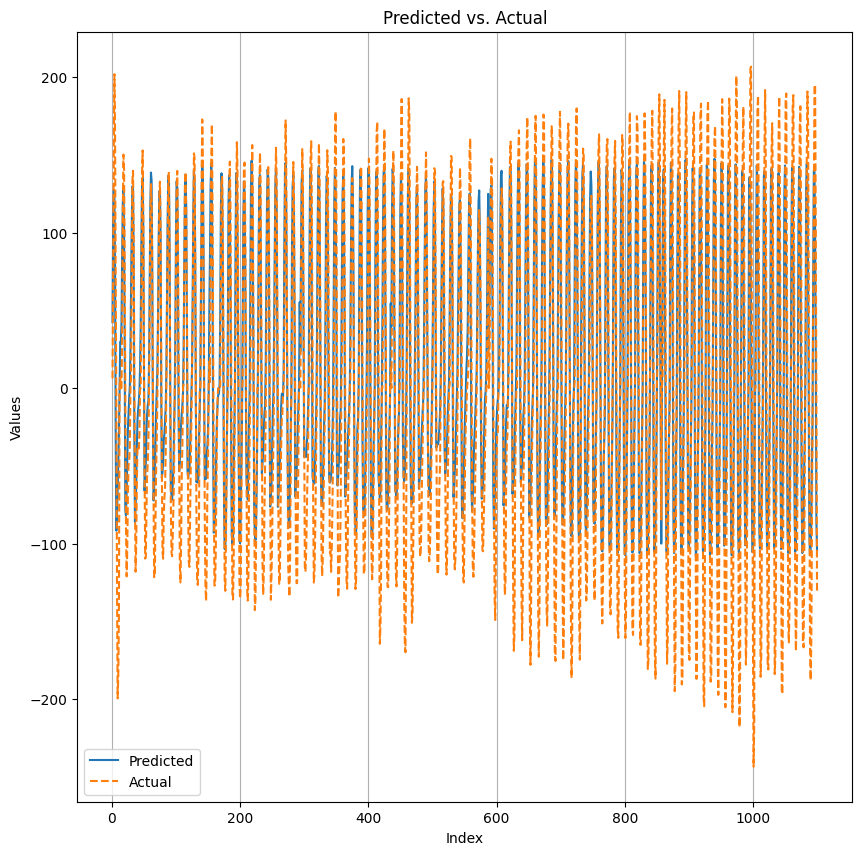

In [12]:
ResultadosRegressao(Resultados3Matrix[0],Resultados3Matrix[1],Resultados3Matrix[3])

# Exercicio 3 Cross Validation Repeticoes

SCENE 0  TRAIN: [3053 3414 4461 ... 3626 4722 3633]  TEST: [   0    1    2 ... 4712 4713 4714]
Epoch 1/30
236/236 [==============================] - 10s 15ms/step - loss: 0.1245 - val_loss: 0.1129
Epoch 2/30
236/236 [==============================] - 3s 12ms/step - loss: 0.0938 - val_loss: 0.1220
Epoch 3/30
236/236 [==============================] - 4s 15ms/step - loss: 0.0792 - val_loss: 0.1020
Epoch 4/30
236/236 [==============================] - 3s 12ms/step - loss: 0.0699 - val_loss: 0.0776
Epoch 5/30
236/236 [==============================] - 3s 11ms/step - loss: 0.0566 - val_loss: 0.0595
Epoch 6/30
236/236 [==============================] - 3s 11ms/step - loss: 0.0483 - val_loss: 0.0510
Epoch 7/30
236/236 [==============================] - 3s 11ms/step - loss: 0.0474 - val_loss: 0.0599
Epoch 8/30
236/236 [==============================] - 4s 16ms/step - loss: 0.0439 - val_loss: 0.0472
Epoch 9/30
236/236 [==============================] - 3s 11ms/step - loss: 0.0415 - val_loss: 0.

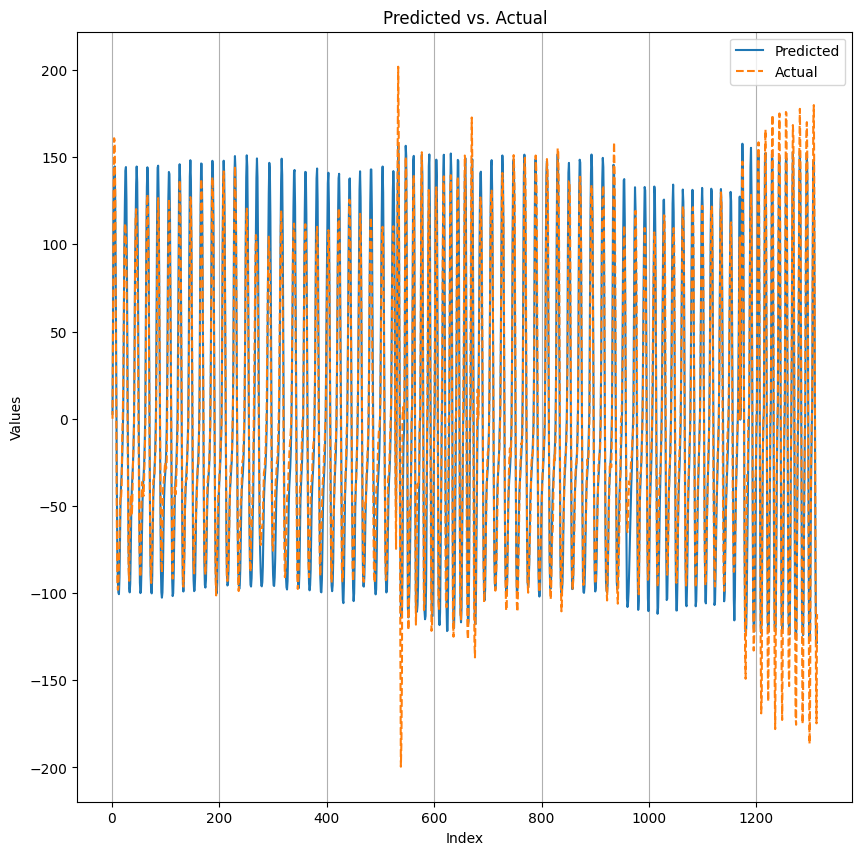

SCENE 1  TRAIN: [3459 1722 2855 ... 3245 1586 3489]  TEST: [ 263  264  265 ... 4838 4839 4840]
Epoch 1/30
239/239 [==============================] - 10s 16ms/step - loss: 0.1172 - val_loss: 0.0592
Epoch 2/30
239/239 [==============================] - 3s 12ms/step - loss: 0.0690 - val_loss: 0.0475
Epoch 3/30
239/239 [==============================] - 3s 13ms/step - loss: 0.0559 - val_loss: 0.0463
Epoch 4/30
239/239 [==============================] - 4s 15ms/step - loss: 0.0540 - val_loss: 0.0353
Epoch 5/30
239/239 [==============================] - 3s 12ms/step - loss: 0.0476 - val_loss: 0.0649
Epoch 6/30
239/239 [==============================] - 3s 12ms/step - loss: 0.0451 - val_loss: 0.0410
Epoch 7/30
239/239 [==============================] - 3s 12ms/step - loss: 0.0442 - val_loss: 0.0538
Epoch 8/30
239/239 [==============================] - 3s 14ms/step - loss: 0.0416 - val_loss: 0.0394
Epoch 9/30
239/239 [==============================] - 3s 14ms/step - loss: 0.0427 - val_loss: 0.

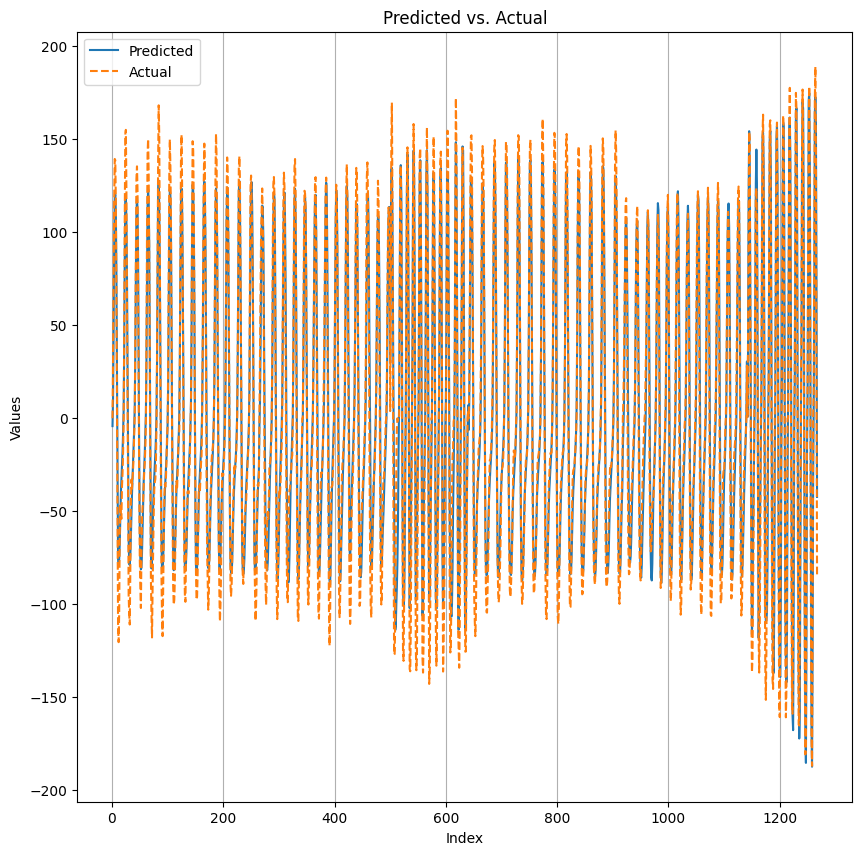

SCENE 2  TRAIN: [ 157 4666 1177 ...  323 2618 3832]  TEST: [ 527  528  529 ... 4961 4962 4963]
Epoch 1/30
241/241 [==============================] - 9s 15ms/step - loss: 0.1468 - val_loss: 0.1564
Epoch 2/30
241/241 [==============================] - 3s 12ms/step - loss: 0.1220 - val_loss: 0.0598
Epoch 3/30
241/241 [==============================] - 4s 15ms/step - loss: 0.0637 - val_loss: 0.0622
Epoch 4/30
241/241 [==============================] - 4s 15ms/step - loss: 0.0611 - val_loss: 0.0489
Epoch 5/30
241/241 [==============================] - 3s 12ms/step - loss: 0.0502 - val_loss: 0.0472
Epoch 6/30
241/241 [==============================] - 3s 12ms/step - loss: 0.0486 - val_loss: 0.0386
Epoch 7/30
241/241 [==============================] - 3s 12ms/step - loss: 0.0438 - val_loss: 0.0363
Epoch 8/30
241/241 [==============================] - 4s 17ms/step - loss: 0.0408 - val_loss: 0.0404
Epoch 9/30
241/241 [==============================] - 3s 13ms/step - loss: 0.0391 - val_loss: 0.0

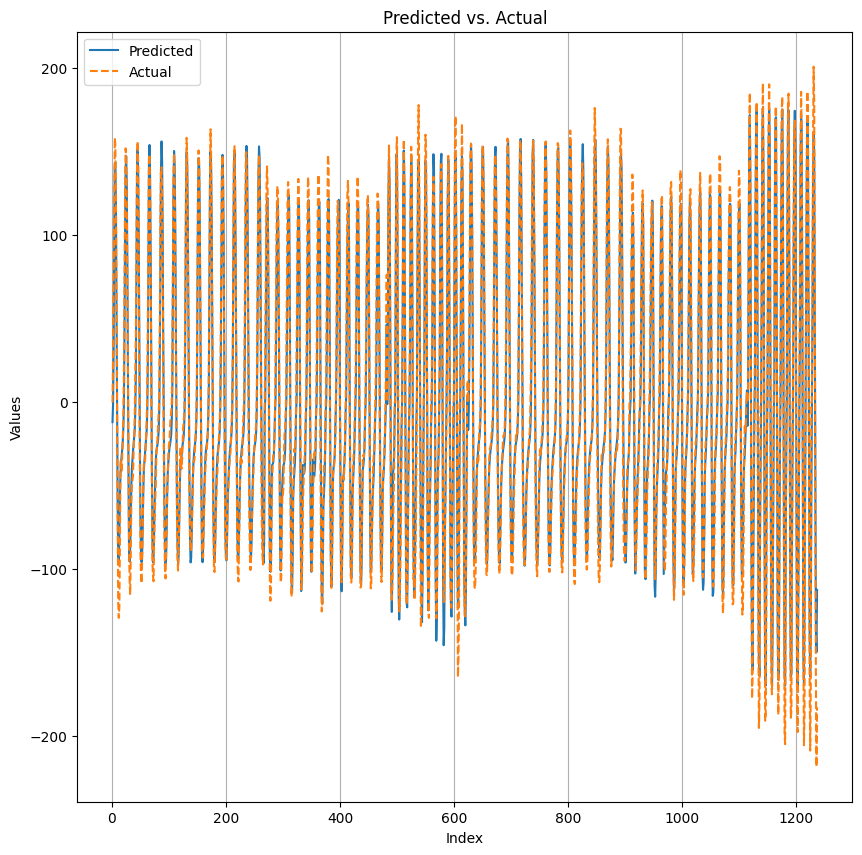

SCENE 3  TRAIN: [2089  509 2638 ... 2368 2067 4819]  TEST: [ 794  795  796 ... 5081 5082 5083]
Epoch 1/30
239/239 [==============================] - 10s 16ms/step - loss: 0.1369 - val_loss: 0.1502
Epoch 2/30
239/239 [==============================] - 3s 13ms/step - loss: 0.0843 - val_loss: 0.0720
Epoch 3/30
239/239 [==============================] - 3s 13ms/step - loss: 0.0652 - val_loss: 0.0827
Epoch 4/30
239/239 [==============================] - 4s 17ms/step - loss: 0.0510 - val_loss: 0.0531
Epoch 5/30
239/239 [==============================] - 3s 14ms/step - loss: 0.0534 - val_loss: 0.0458
Epoch 6/30
239/239 [==============================] - 3s 14ms/step - loss: 0.0471 - val_loss: 0.0464
Epoch 7/30
239/239 [==============================] - 3s 13ms/step - loss: 0.0464 - val_loss: 0.0430
Epoch 8/30
239/239 [==============================] - 4s 15ms/step - loss: 0.0440 - val_loss: 0.0470
Epoch 9/30
239/239 [==============================] - 4s 16ms/step - loss: 0.0418 - val_loss: 0.

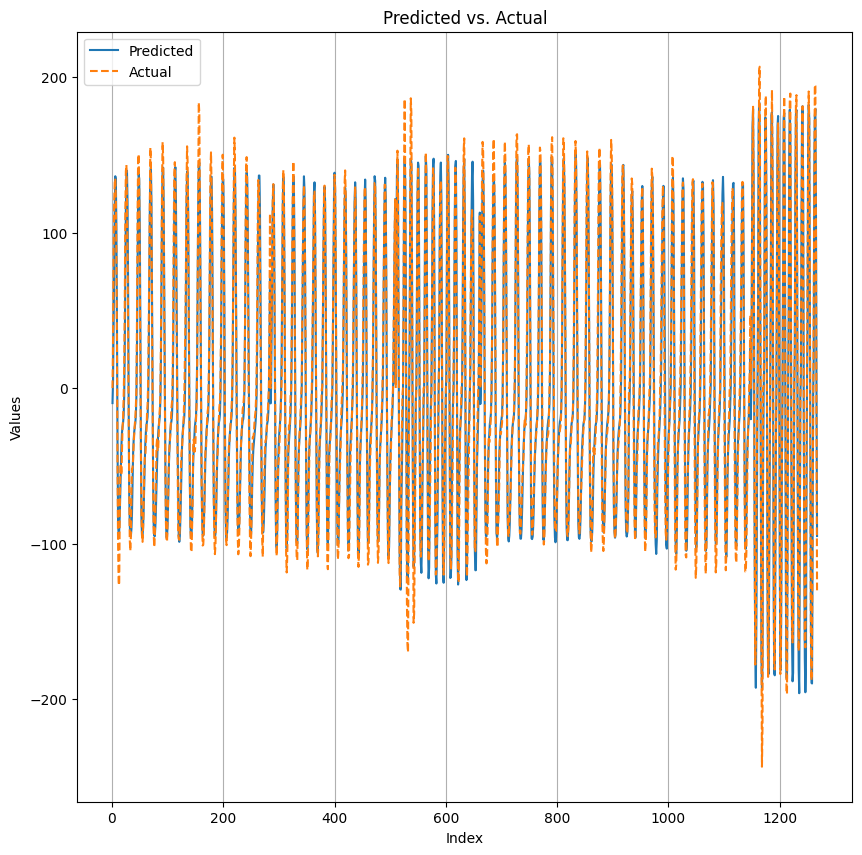

In [13]:
ResultadosRegressao(Resultados3Matrix[0],Resultados3Matrix[1],Resultados3Matrix[4])

# Exercicio 3 Cross Validation Scenes

SCENE 0  TRAIN: [4947 1954  826 ... 2241 4555 2491]  TEST: [  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35
  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53
  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71
  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89
  90  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107
 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125
 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143
 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161
 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179
 180 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196 197
 198 199 200 201 202 203 204 205 206 207 208 209 210 211 212 213 214 215
 216 217 218 219 220 221 222 223 224 225 226 227 228 229 230 231 

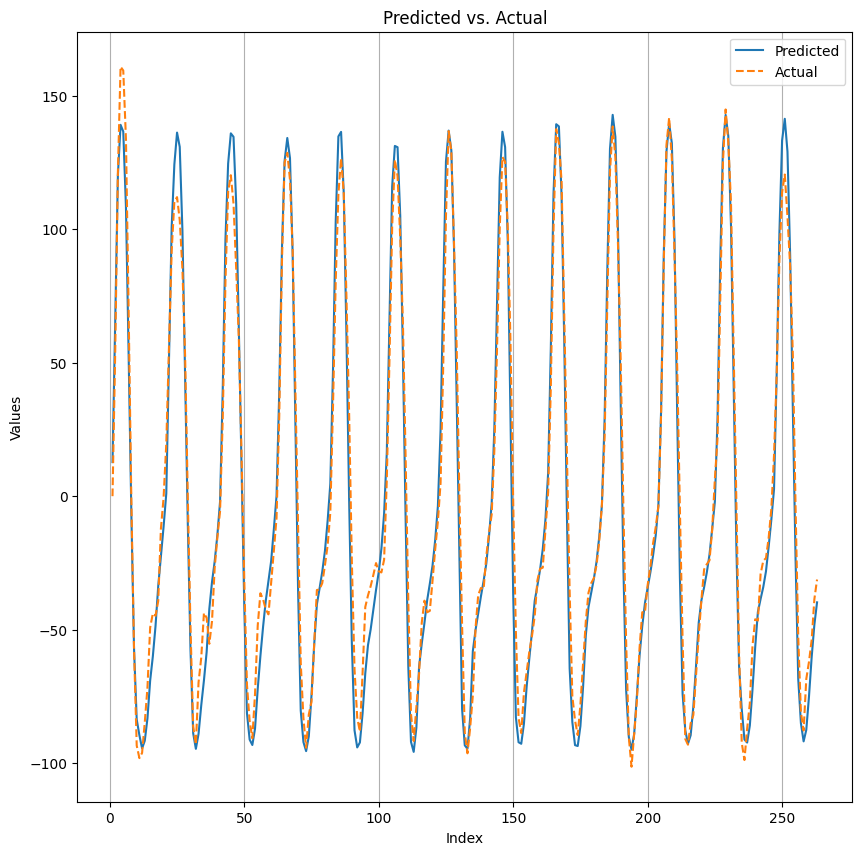

SCENE 1  TRAIN: [  53  195 3259 ...  238 2587   74]  TEST: [263 264 265 266 267 268 269 270 271 272 273 274 275 276 277 278 279 280
 281 282 283 284 285 286 287 288 289 290 291 292 293 294 295 296 297 298
 299 300 301 302 303 304 305 306 307 308 309 310 311 312 313 314 315 316
 317 318 319 320 321 322 323 324 325 326 327 328 329 330 331 332 333 334
 335 336 337 338 339 340 341 342 343 344 345 346 347 348 349 350 351 352
 353 354 355 356 357 358 359 360 361 362 363 364 365 366 367 368 369 370
 371 372 373 374 375 376 377 378 379 380 381 382 383 384 385 386 387 388
 389 390 391 392 393 394 395 396 397 398 399 400 401 402 403 404 405 406
 407 408 409 410 411 412 413 414 415 416 417 418 419 420 421 422 423 424
 425 426 427 428 429 430 431 432 433 434 435 436 437 438 439 440 441 442
 443 444 445 446 447 448 449 450 451 452 453 454 455 456 457 458 459 460
 461 462 463 464 465 466 467 468 469 470 471 472 473 474 475 476 477 478
 479 480 481 482 483 484 485 486 487 488 489 490 491 492 493 494 

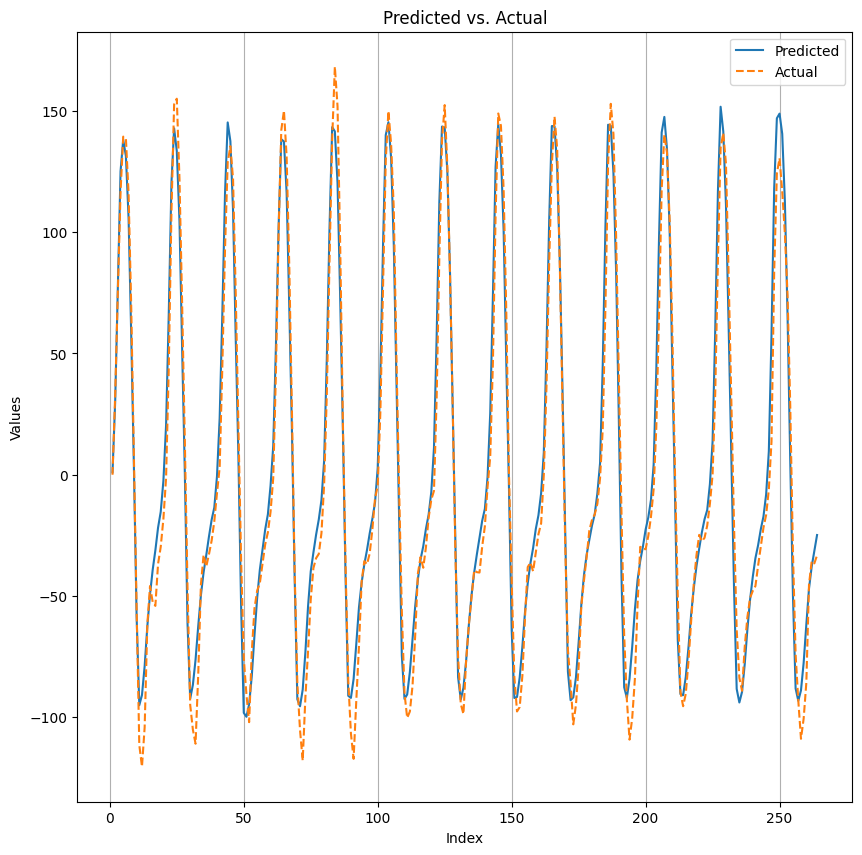

SCENE 2  TRAIN: [1649 1500 2935 ... 4424 2509 4383]  TEST: [527 528 529 530 531 532 533 534 535 536 537 538 539 540 541 542 543 544
 545 546 547 548 549 550 551 552 553 554 555 556 557 558 559 560 561 562
 563 564 565 566 567 568 569 570 571 572 573 574 575 576 577 578 579 580
 581 582 583 584 585 586 587 588 589 590 591 592 593 594 595 596 597 598
 599 600 601 602 603 604 605 606 607 608 609 610 611 612 613 614 615 616
 617 618 619 620 621 622 623 624 625 626 627 628 629 630 631 632 633 634
 635 636 637 638 639 640 641 642 643 644 645 646 647 648 649 650 651 652
 653 654 655 656 657 658 659 660 661 662 663 664 665 666 667 668 669 670
 671 672 673 674 675 676 677 678 679 680 681 682 683 684 685 686 687 688
 689 690 691 692 693 694 695 696 697 698 699 700 701 702 703 704 705 706
 707 708 709 710 711 712 713 714 715 716 717 718 719 720 721 722 723 724
 725 726 727 728 729 730 731 732 733 734 735 736 737 738 739 740 741 742
 743 744 745 746 747 748 749 750 751 752 753 754 755 756 757 758 

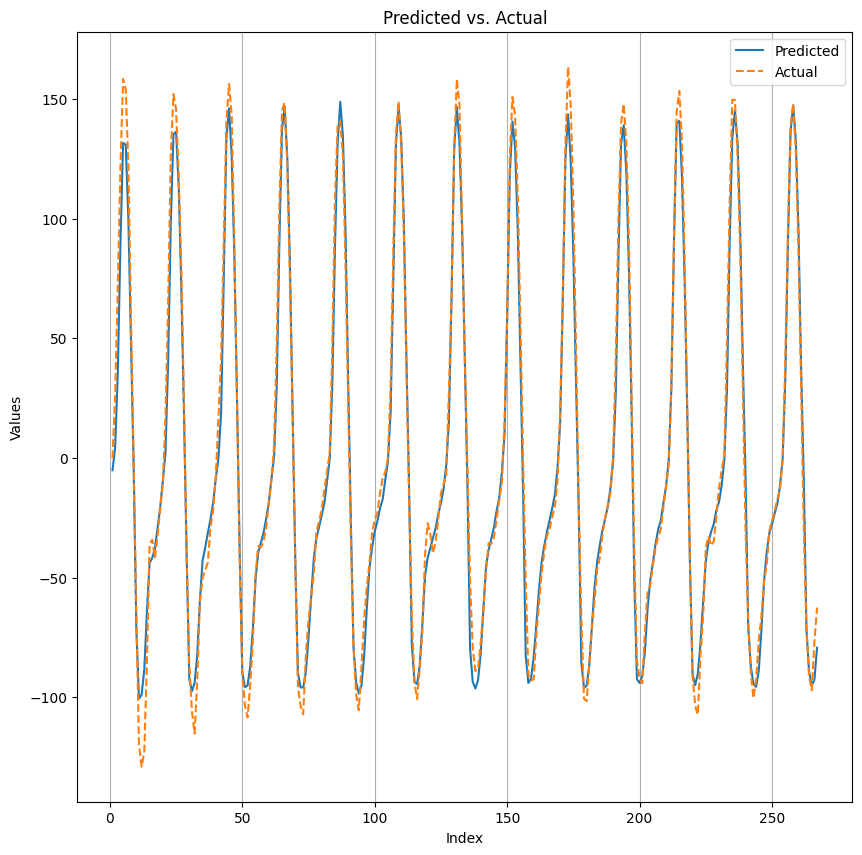

SCENE 3  TRAIN: [3339 3177 2024 ... 4139  335  681]  TEST: [ 794  795  796  797  798  799  800  801  802  803  804  805  806  807
  808  809  810  811  812  813  814  815  816  817  818  819  820  821
  822  823  824  825  826  827  828  829  830  831  832  833  834  835
  836  837  838  839  840  841  842  843  844  845  846  847  848  849
  850  851  852  853  854  855  856  857  858  859  860  861  862  863
  864  865  866  867  868  869  870  871  872  873  874  875  876  877
  878  879  880  881  882  883  884  885  886  887  888  889  890  891
  892  893  894  895  896  897  898  899  900  901  902  903  904  905
  906  907  908  909  910  911  912  913  914  915  916  917  918  919
  920  921  922  923  924  925  926  927  928  929  930  931  932  933
  934  935  936  937  938  939  940  941  942  943  944  945  946  947
  948  949  950  951  952  953  954  955  956  957  958  959  960  961
  962  963  964  965  966  967  968  969  970  971  972  973  974  975
  976  977  978  9

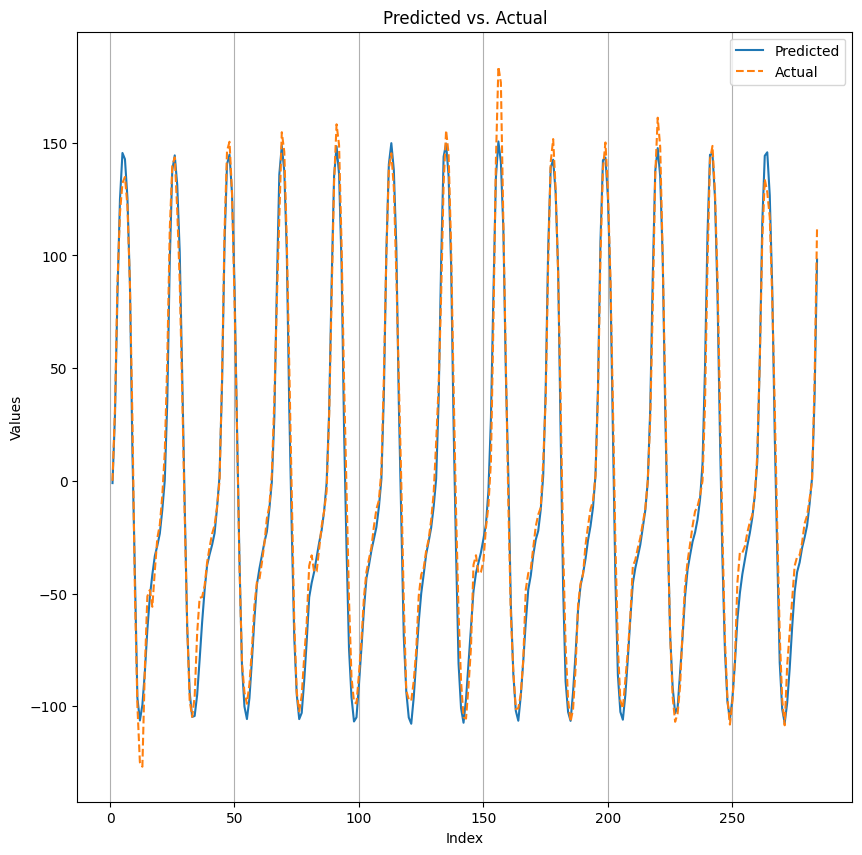

SCENE 4  TRAIN: [4926 3444 3669 ... 2287 4375 4318]  TEST: [1078 1079 1080 1081 1082 1083 1084 1085 1086 1087 1088 1089 1090 1091
 1092 1093 1094 1095 1096 1097 1098 1099 1100 1101 1102 1103 1104 1105
 1106 1107 1108 1109 1110 1111 1112 1113 1114 1115 1116 1117 1118 1119
 1120 1121 1122 1123 1124 1125 1126 1127 1128 1129 1130 1131 1132 1133
 1134 1135 1136 1137 1138 1139 1140 1141 1142 1143 1144 1145 1146 1147
 1148 1149 1150 1151 1152 1153 1154 1155 1156 1157 1158 1159 1160 1161
 1162 1163 1164 1165 1166 1167 1168 1169 1170 1171 1172 1173 1174 1175
 1176 1177 1178 1179 1180 1181 1182 1183 1184 1185 1186 1187 1188 1189
 1190 1191 1192 1193 1194 1195 1196 1197 1198 1199 1200 1201 1202 1203
 1204 1205 1206 1207 1208 1209 1210 1211 1212 1213 1214 1215 1216 1217
 1218 1219 1220 1221 1222 1223 1224 1225 1226 1227 1228 1229 1230 1231
 1232 1233 1234 1235 1236 1237 1238 1239 1240 1241 1242 1243 1244 1245
 1246 1247 1248 1249 1250 1251 1252 1253 1254 1255 1256 1257 1258 1259
 1260 1261 1262 12

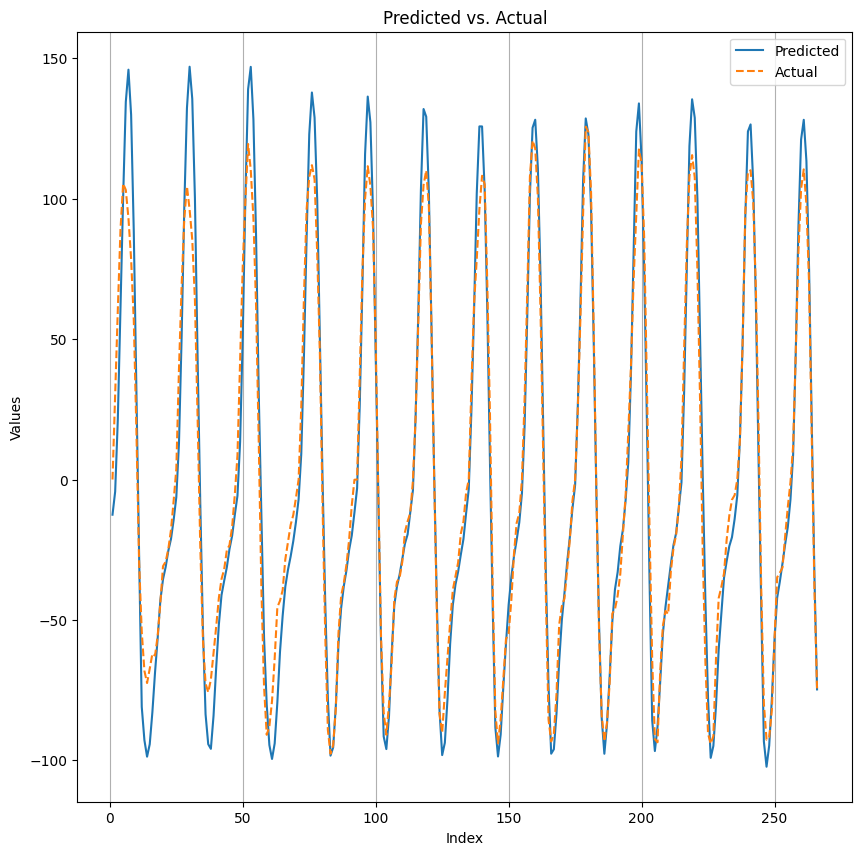

SCENE 5  TRAIN: [4134 4328 3593 ... 2936 1625  986]  TEST: [1344 1345 1346 1347 1348 1349 1350 1351 1352 1353 1354 1355 1356 1357
 1358 1359 1360 1361 1362 1363 1364 1365 1366 1367 1368 1369 1370 1371
 1372 1373 1374 1375 1376 1377 1378 1379 1380 1381 1382 1383 1384 1385
 1386 1387 1388 1389 1390 1391 1392 1393 1394 1395 1396 1397 1398 1399
 1400 1401 1402 1403 1404 1405 1406 1407 1408 1409 1410 1411 1412 1413
 1414 1415 1416 1417 1418 1419 1420 1421 1422 1423 1424 1425 1426 1427
 1428 1429 1430 1431 1432 1433 1434 1435 1436 1437 1438 1439 1440 1441
 1442 1443 1444 1445 1446 1447 1448 1449 1450 1451 1452 1453 1454 1455
 1456 1457 1458 1459 1460 1461 1462 1463 1464 1465 1466 1467 1468 1469
 1470 1471 1472 1473 1474 1475 1476 1477 1478 1479 1480 1481 1482 1483
 1484 1485 1486 1487 1488 1489 1490 1491 1492 1493 1494 1495 1496 1497
 1498 1499 1500 1501 1502 1503 1504 1505 1506 1507 1508 1509 1510 1511
 1512 1513 1514 1515 1516 1517 1518 1519 1520 1521 1522 1523 1524 1525
 1526 1527 1528 15

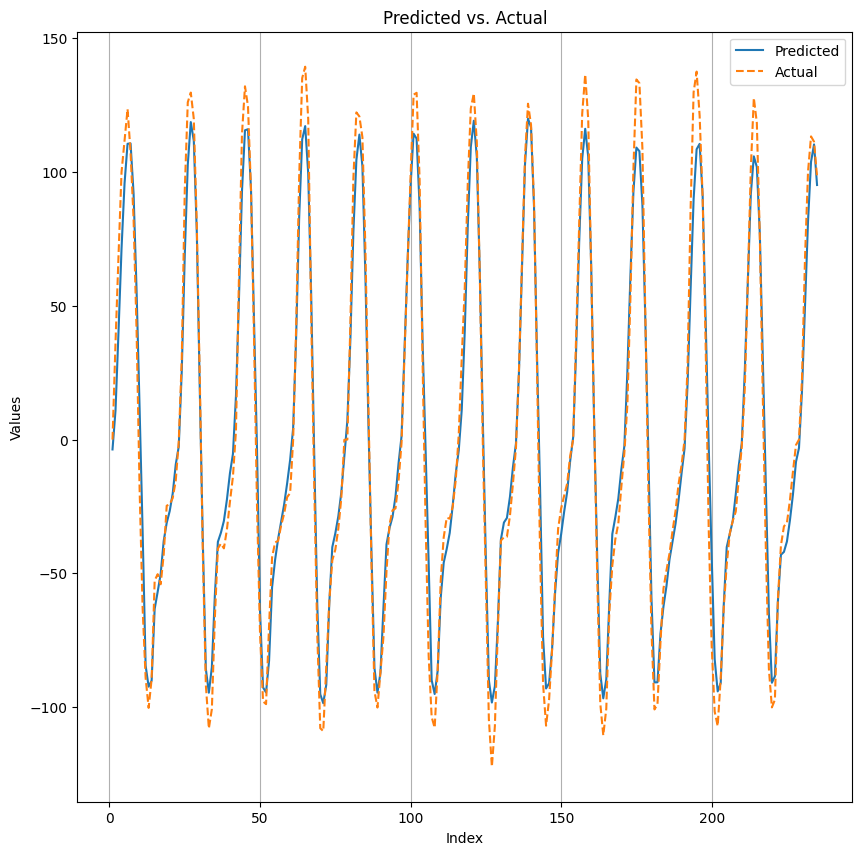

SCENE 6  TRAIN: [ 387 2248 2048 ... 1451 2056 1401]  TEST: [1579 1580 1581 1582 1583 1584 1585 1586 1587 1588 1589 1590 1591 1592
 1593 1594 1595 1596 1597 1598 1599 1600 1601 1602 1603 1604 1605 1606
 1607 1608 1609 1610 1611 1612 1613 1614 1615 1616 1617 1618 1619 1620
 1621 1622 1623 1624 1625 1626 1627 1628 1629 1630 1631 1632 1633 1634
 1635 1636 1637 1638 1639 1640 1641 1642 1643 1644 1645 1646 1647 1648
 1649 1650 1651 1652 1653 1654 1655 1656 1657 1658 1659 1660 1661 1662
 1663 1664 1665 1666 1667 1668 1669 1670 1671 1672 1673 1674 1675 1676
 1677 1678 1679 1680 1681 1682 1683 1684 1685 1686 1687 1688 1689 1690
 1691 1692 1693 1694 1695 1696 1697 1698 1699 1700 1701 1702 1703 1704
 1705 1706 1707 1708 1709 1710 1711 1712 1713 1714 1715 1716 1717 1718
 1719 1720 1721 1722 1723 1724 1725 1726 1727 1728 1729 1730 1731 1732
 1733 1734 1735 1736 1737 1738 1739 1740 1741 1742 1743 1744 1745 1746
 1747 1748 1749 1750 1751 1752 1753 1754 1755 1756 1757 1758 1759 1760
 1761 1762 1763 17

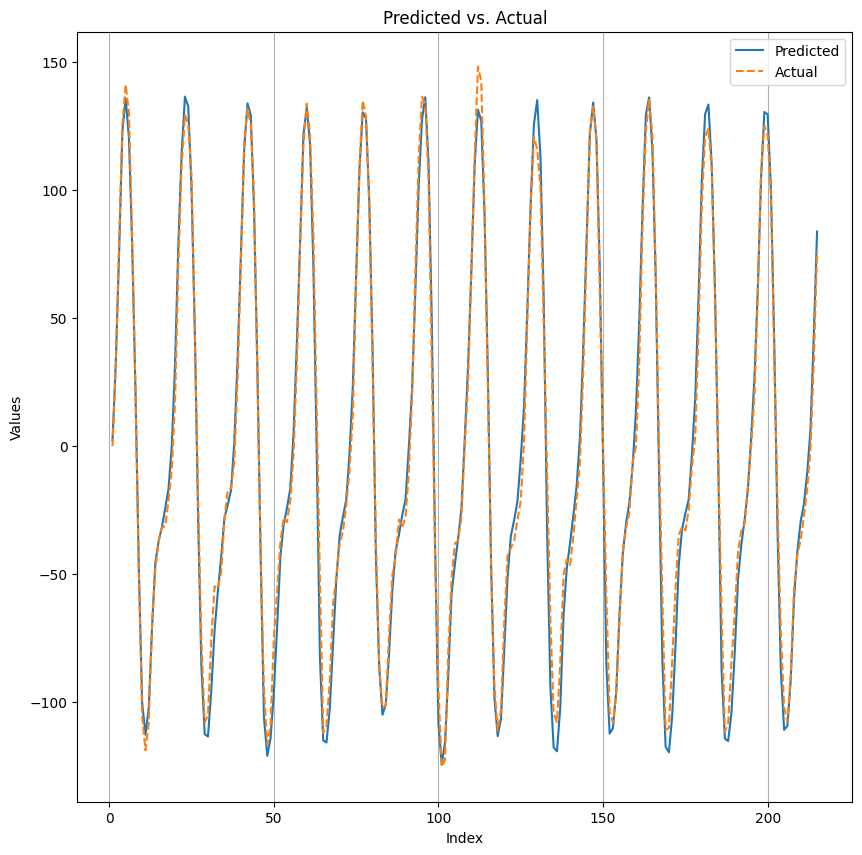

SCENE 7  TRAIN: [3639  536 4509 ... 4772 2178 4895]  TEST: [1794 1795 1796 1797 1798 1799 1800 1801 1802 1803 1804 1805 1806 1807
 1808 1809 1810 1811 1812 1813 1814 1815 1816 1817 1818 1819 1820 1821
 1822 1823 1824 1825 1826 1827 1828 1829 1830 1831 1832 1833 1834 1835
 1836 1837 1838 1839 1840 1841 1842 1843 1844 1845 1846 1847 1848 1849
 1850 1851 1852 1853 1854 1855 1856 1857 1858 1859 1860 1861 1862 1863
 1864 1865 1866 1867 1868 1869 1870 1871 1872 1873 1874 1875 1876 1877
 1878 1879 1880 1881 1882 1883 1884 1885 1886 1887 1888 1889 1890 1891
 1892 1893 1894 1895 1896 1897 1898 1899 1900 1901 1902 1903 1904 1905
 1906 1907 1908 1909 1910 1911 1912 1913 1914 1915 1916 1917 1918 1919
 1920 1921 1922 1923 1924 1925 1926 1927 1928 1929 1930 1931 1932 1933
 1934 1935 1936 1937 1938 1939 1940 1941 1942 1943 1944 1945 1946 1947
 1948 1949 1950 1951 1952 1953 1954 1955 1956 1957 1958 1959 1960 1961
 1962 1963 1964 1965 1966 1967 1968 1969 1970 1971 1972 1973 1974 1975
 1976 1977 1978 19

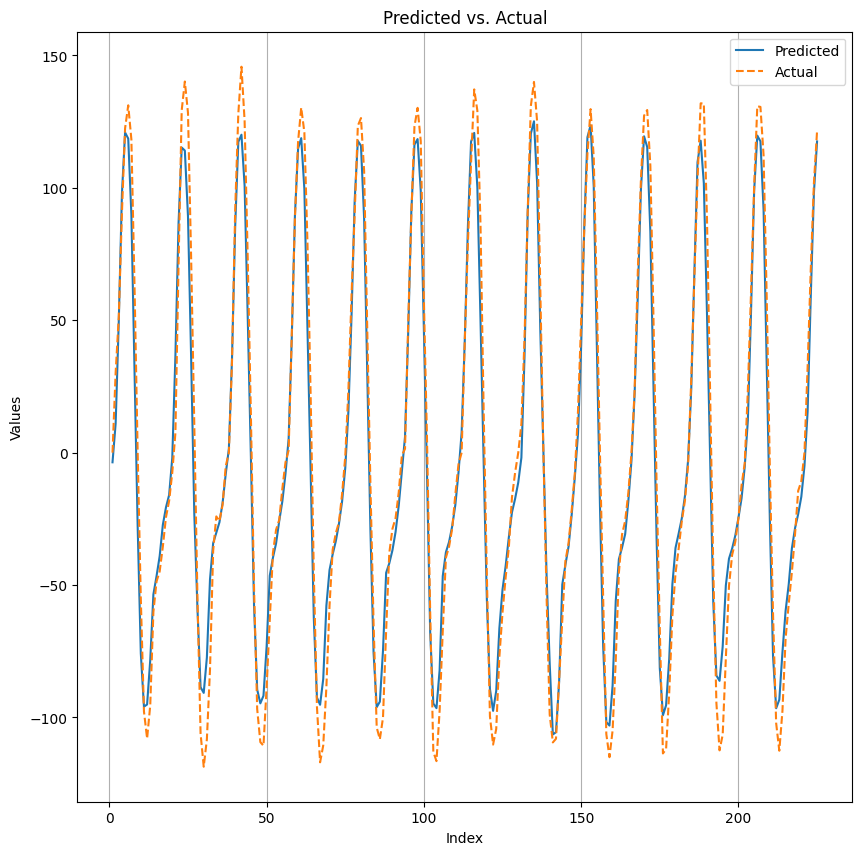

SCENE 8  TRAIN: [4177 2665 3594 ... 2353 5006 1286]  TEST: [2019 2020 2021 2022 2023 2024 2025 2026 2027 2028 2029 2030 2031 2032
 2033 2034 2035 2036 2037 2038 2039 2040 2041 2042 2043 2044 2045 2046
 2047 2048 2049 2050 2051 2052 2053 2054 2055 2056 2057 2058 2059 2060
 2061 2062 2063 2064 2065 2066 2067 2068 2069 2070 2071 2072 2073 2074
 2075 2076 2077 2078 2079 2080 2081 2082 2083 2084 2085 2086 2087 2088
 2089 2090 2091 2092 2093 2094 2095 2096 2097 2098 2099 2100 2101 2102
 2103 2104 2105 2106 2107 2108 2109 2110 2111 2112 2113 2114 2115 2116
 2117 2118 2119 2120 2121 2122 2123 2124 2125 2126 2127 2128 2129 2130
 2131 2132 2133 2134 2135 2136 2137 2138 2139 2140 2141 2142 2143 2144
 2145 2146 2147 2148 2149 2150 2151 2152 2153 2154 2155 2156 2157 2158
 2159 2160 2161 2162 2163 2164 2165 2166 2167 2168 2169 2170]
Epoch 1/30
309/309 [==============================] - 9s 14ms/step - loss: 0.1025 - val_loss: 0.1400
Epoch 2/30
309/309 [==============================] - 4s 14ms/step -

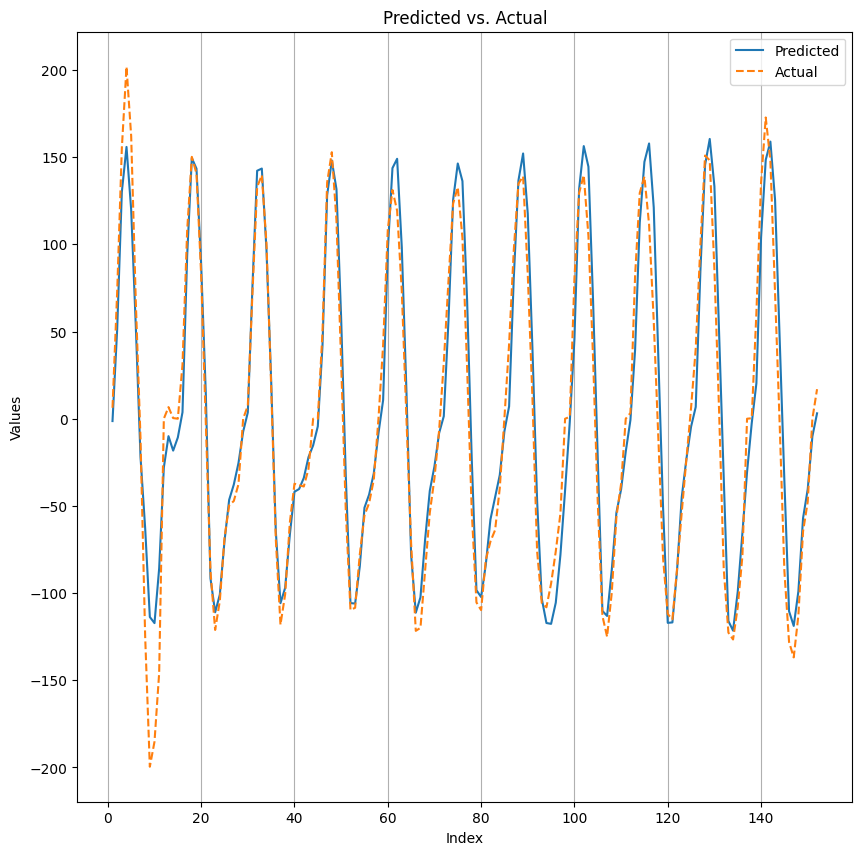

SCENE 9  TRAIN: [ 512 1487 1780 ... 2316  396 1272]  TEST: [2171 2172 2173 2174 2175 2176 2177 2178 2179 2180 2181 2182 2183 2184
 2185 2186 2187 2188 2189 2190 2191 2192 2193 2194 2195 2196 2197 2198
 2199 2200 2201 2202 2203 2204 2205 2206 2207 2208 2209 2210 2211 2212
 2213 2214 2215 2216 2217 2218 2219 2220 2221 2222 2223 2224 2225 2226
 2227 2228 2229 2230 2231 2232 2233 2234 2235 2236 2237 2238 2239 2240
 2241 2242 2243 2244 2245 2246 2247 2248 2249 2250 2251 2252 2253 2254
 2255 2256 2257 2258 2259 2260 2261 2262 2263 2264 2265 2266 2267 2268
 2269 2270 2271 2272 2273 2274 2275 2276 2277 2278 2279 2280 2281 2282
 2283 2284 2285 2286 2287 2288 2289 2290 2291 2292 2293 2294 2295 2296
 2297 2298 2299 2300 2301 2302 2303 2304 2305 2306 2307 2308 2309 2310
 2311]
Epoch 1/30
309/309 [==============================] - 11s 15ms/step - loss: 0.1389 - val_loss: 0.1533
Epoch 2/30
309/309 [==============================] - 4s 14ms/step - loss: 0.0924 - val_loss: 0.1424
Epoch 3/30
309/309 [=

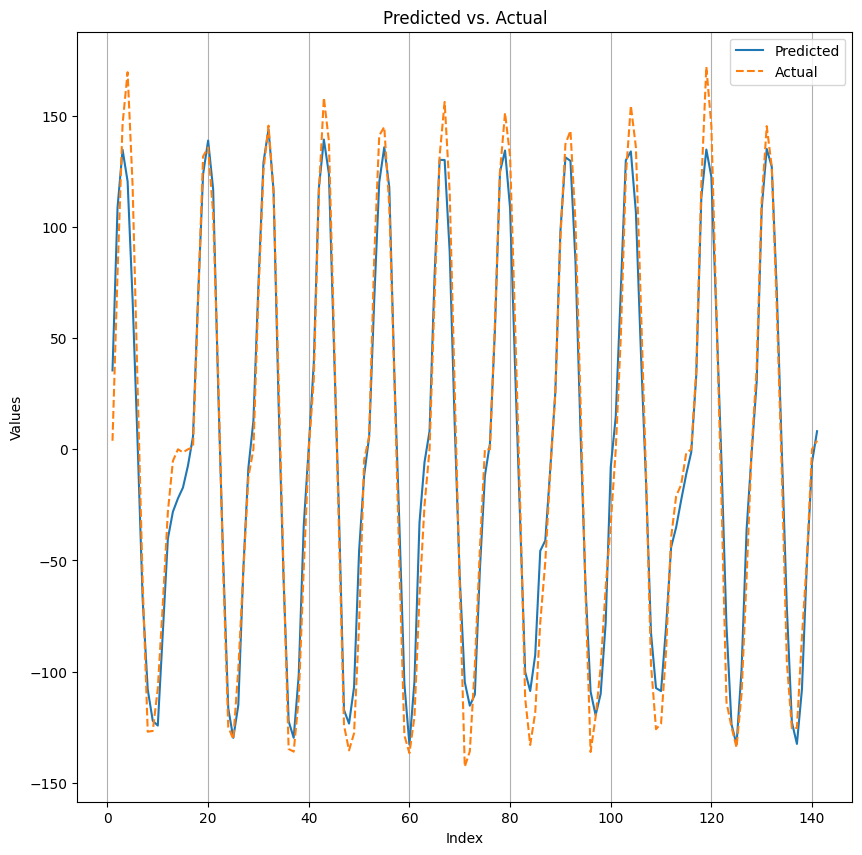

SCENE 10  TRAIN: [3462 3449 2210 ...  719 1660 3398]  TEST: [2312 2313 2314 2315 2316 2317 2318 2319 2320 2321 2322 2323 2324 2325
 2326 2327 2328 2329 2330 2331 2332 2333 2334 2335 2336 2337 2338 2339
 2340 2341 2342 2343 2344 2345 2346 2347 2348 2349 2350 2351 2352 2353
 2354 2355 2356 2357 2358 2359 2360 2361 2362 2363 2364 2365 2366 2367
 2368 2369 2370 2371 2372 2373 2374 2375 2376 2377 2378 2379 2380 2381
 2382 2383 2384 2385 2386 2387 2388 2389 2390 2391 2392 2393 2394 2395
 2396 2397 2398 2399 2400 2401 2402 2403 2404 2405 2406 2407 2408 2409
 2410 2411 2412 2413 2414 2415 2416 2417 2418 2419 2420 2421 2422 2423
 2424 2425 2426 2427 2428 2429 2430 2431 2432 2433 2434 2435 2436 2437
 2438 2439 2440 2441 2442 2443 2444 2445 2446 2447 2448 2449 2450 2451
 2452 2453]
Epoch 1/30
309/309 [==============================] - 11s 17ms/step - loss: 0.1385 - val_loss: 0.1768
Epoch 2/30
309/309 [==============================] - 4s 12ms/step - loss: 0.0784 - val_loss: 0.0639
Epoch 3/30
309/

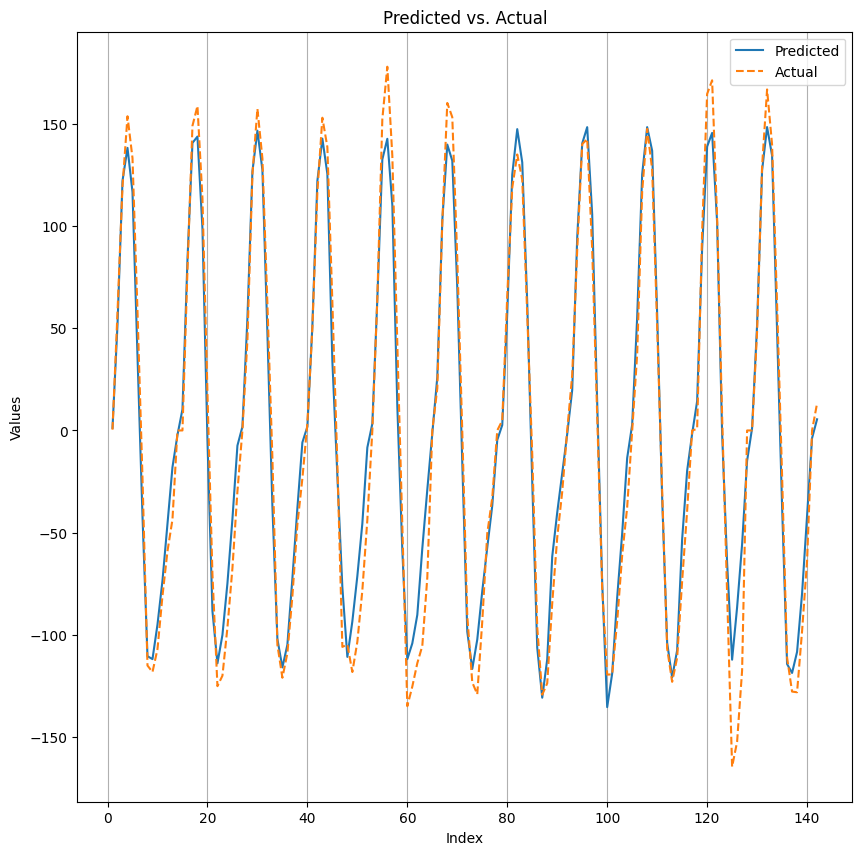

SCENE 11  TRAIN: [1729  318 2119 ... 2886  711 3446]  TEST: [2454 2455 2456 2457 2458 2459 2460 2461 2462 2463 2464 2465 2466 2467
 2468 2469 2470 2471 2472 2473 2474 2475 2476 2477 2478 2479 2480 2481
 2482 2483 2484 2485 2486 2487 2488 2489 2490 2491 2492 2493 2494 2495
 2496 2497 2498 2499 2500 2501 2502 2503 2504 2505 2506 2507 2508 2509
 2510 2511 2512 2513 2514 2515 2516 2517 2518 2519 2520 2521 2522 2523
 2524 2525 2526 2527 2528 2529 2530 2531 2532 2533 2534 2535 2536 2537
 2538 2539 2540 2541 2542 2543 2544 2545 2546 2547 2548 2549 2550 2551
 2552 2553 2554 2555 2556 2557 2558 2559 2560 2561 2562 2563 2564 2565
 2566 2567 2568 2569 2570 2571 2572 2573 2574 2575 2576 2577 2578 2579
 2580 2581 2582 2583 2584 2585 2586 2587 2588 2589 2590 2591 2592 2593
 2594 2595 2596 2597 2598 2599 2600 2601 2602 2603 2604 2605]
Epoch 1/30
309/309 [==============================] - 10s 17ms/step - loss: 0.1125 - val_loss: 0.1922
Epoch 2/30
309/309 [==============================] - 5s 15ms/step

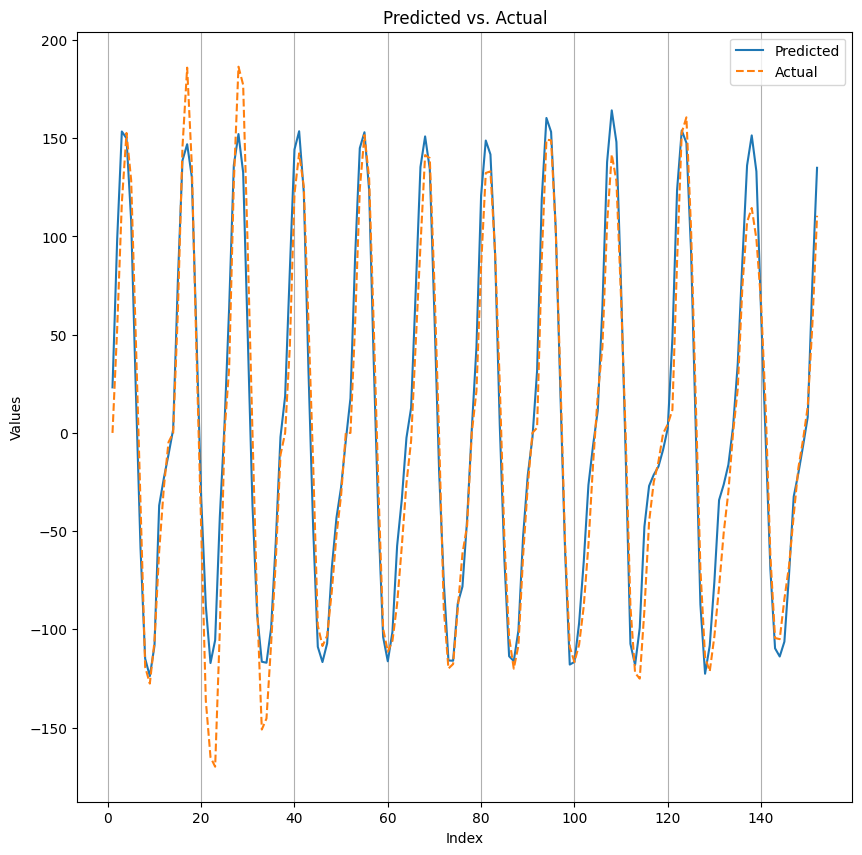

SCENE 12  TRAIN: [ 753 4264 4981 ... 2307 3879 2578]  TEST: [2606 2607 2608 2609 2610 2611 2612 2613 2614 2615 2616 2617 2618 2619
 2620 2621 2622 2623 2624 2625 2626 2627 2628 2629 2630 2631 2632 2633
 2634 2635 2636 2637 2638 2639 2640 2641 2642 2643 2644 2645 2646 2647
 2648 2649 2650 2651 2652 2653 2654 2655 2656 2657 2658 2659 2660 2661
 2662 2663 2664 2665 2666 2667 2668 2669 2670 2671 2672 2673 2674 2675
 2676 2677 2678 2679 2680 2681 2682 2683 2684 2685 2686 2687 2688 2689
 2690 2691 2692 2693 2694 2695 2696 2697 2698 2699 2700 2701 2702 2703
 2704 2705 2706 2707 2708 2709 2710 2711 2712 2713 2714 2715 2716 2717
 2718 2719 2720 2721 2722 2723 2724 2725 2726 2727 2728 2729 2730 2731
 2732 2733 2734 2735 2736 2737 2738 2739 2740 2741 2742 2743 2744 2745
 2746 2747 2748 2749 2750 2751 2752 2753 2754 2755 2756 2757 2758 2759
 2760 2761 2762 2763 2764 2765 2766 2767 2768 2769 2770 2771 2772 2773
 2774 2775 2776 2777 2778 2779 2780 2781 2782 2783 2784 2785 2786 2787
 2788 2789 2790 2

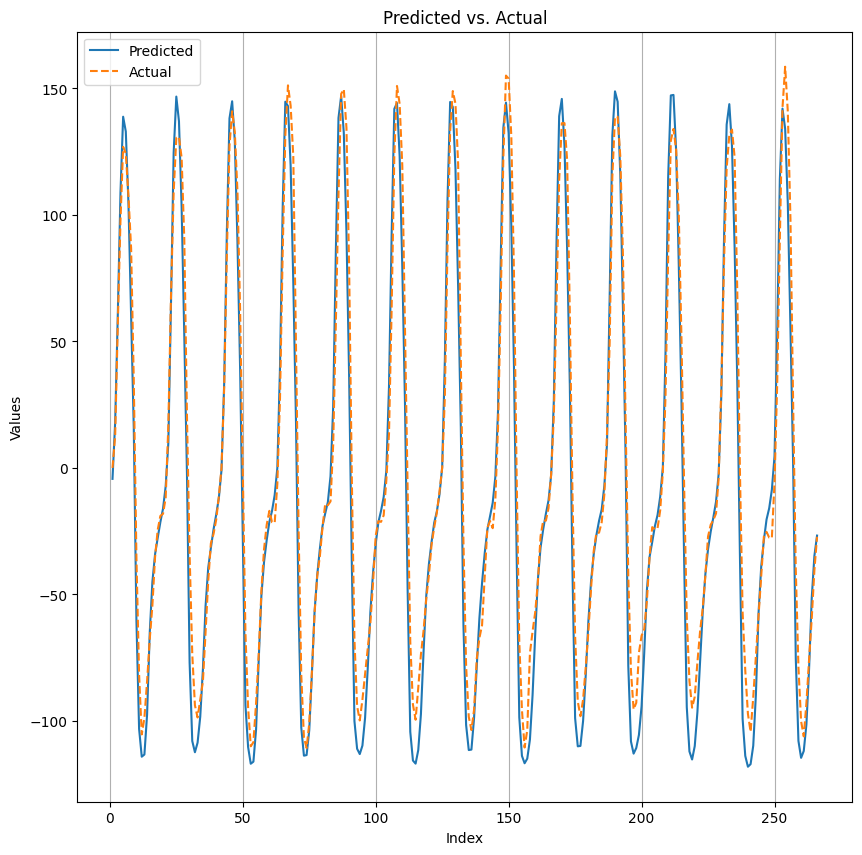

SCENE 13  TRAIN: [4866 3444 4209 ... 1876 4136 2338]  TEST: [2872 2873 2874 2875 2876 2877 2878 2879 2880 2881 2882 2883 2884 2885
 2886 2887 2888 2889 2890 2891 2892 2893 2894 2895 2896 2897 2898 2899
 2900 2901 2902 2903 2904 2905 2906 2907 2908 2909 2910 2911 2912 2913
 2914 2915 2916 2917 2918 2919 2920 2921 2922 2923 2924 2925 2926 2927
 2928 2929 2930 2931 2932 2933 2934 2935 2936 2937 2938 2939 2940 2941
 2942 2943 2944 2945 2946 2947 2948 2949 2950 2951 2952 2953 2954 2955
 2956 2957 2958 2959 2960 2961 2962 2963 2964 2965 2966 2967 2968 2969
 2970 2971 2972 2973 2974 2975 2976 2977 2978 2979 2980 2981 2982 2983
 2984 2985 2986 2987 2988 2989 2990 2991 2992 2993 2994 2995 2996 2997
 2998 2999 3000 3001 3002 3003 3004 3005 3006 3007 3008 3009 3010 3011
 3012 3013 3014 3015 3016 3017 3018 3019 3020 3021 3022 3023 3024 3025
 3026 3027 3028 3029 3030 3031 3032 3033 3034 3035 3036 3037 3038 3039
 3040 3041 3042 3043 3044 3045 3046 3047 3048 3049 3050 3051 3052 3053
 3054 3055 3056 3

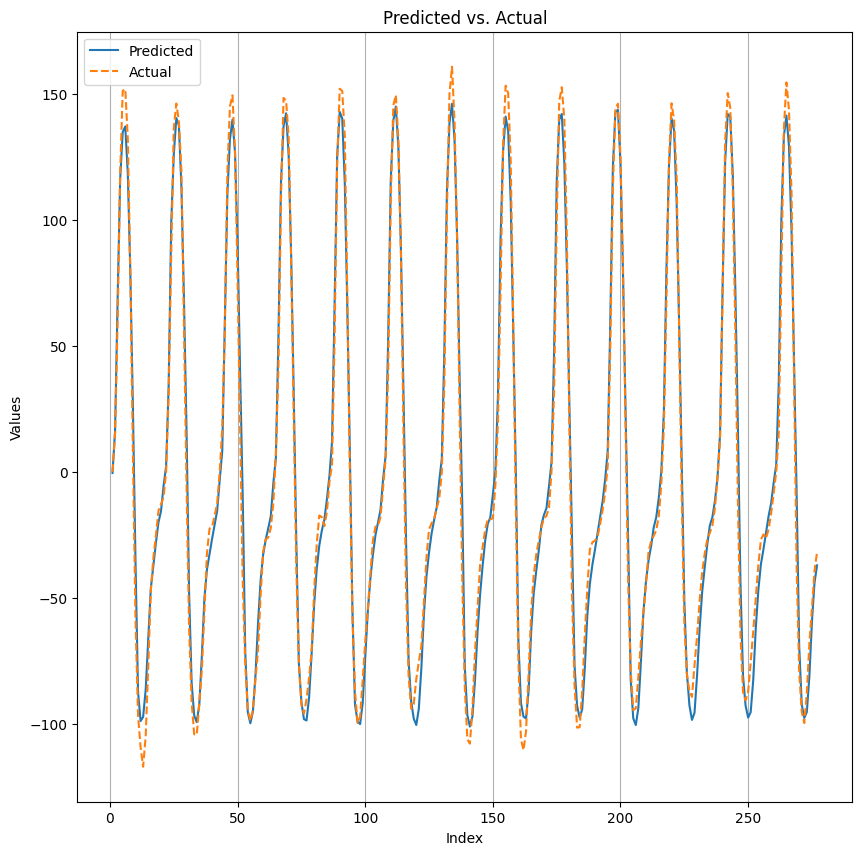

SCENE 14  TRAIN: [ 724  743 1583 ...  931 2143 2368]  TEST: [3149 3150 3151 3152 3153 3154 3155 3156 3157 3158 3159 3160 3161 3162
 3163 3164 3165 3166 3167 3168 3169 3170 3171 3172 3173 3174 3175 3176
 3177 3178 3179 3180 3181 3182 3183 3184 3185 3186 3187 3188 3189 3190
 3191 3192 3193 3194 3195 3196 3197 3198 3199 3200 3201 3202 3203 3204
 3205 3206 3207 3208 3209 3210 3211 3212 3213 3214 3215 3216 3217 3218
 3219 3220 3221 3222 3223 3224 3225 3226 3227 3228 3229 3230 3231 3232
 3233 3234 3235 3236 3237 3238 3239 3240 3241 3242 3243 3244 3245 3246
 3247 3248 3249 3250 3251 3252 3253 3254 3255 3256 3257 3258 3259 3260
 3261 3262 3263 3264 3265 3266 3267 3268 3269 3270 3271 3272 3273 3274
 3275 3276 3277 3278 3279 3280 3281 3282 3283 3284 3285 3286 3287 3288
 3289 3290 3291 3292 3293 3294 3295 3296 3297 3298 3299 3300 3301 3302
 3303 3304 3305 3306 3307 3308 3309 3310 3311 3312 3313 3314 3315 3316
 3317 3318 3319 3320 3321 3322 3323 3324 3325 3326 3327 3328 3329 3330
 3331 3332 3333 3

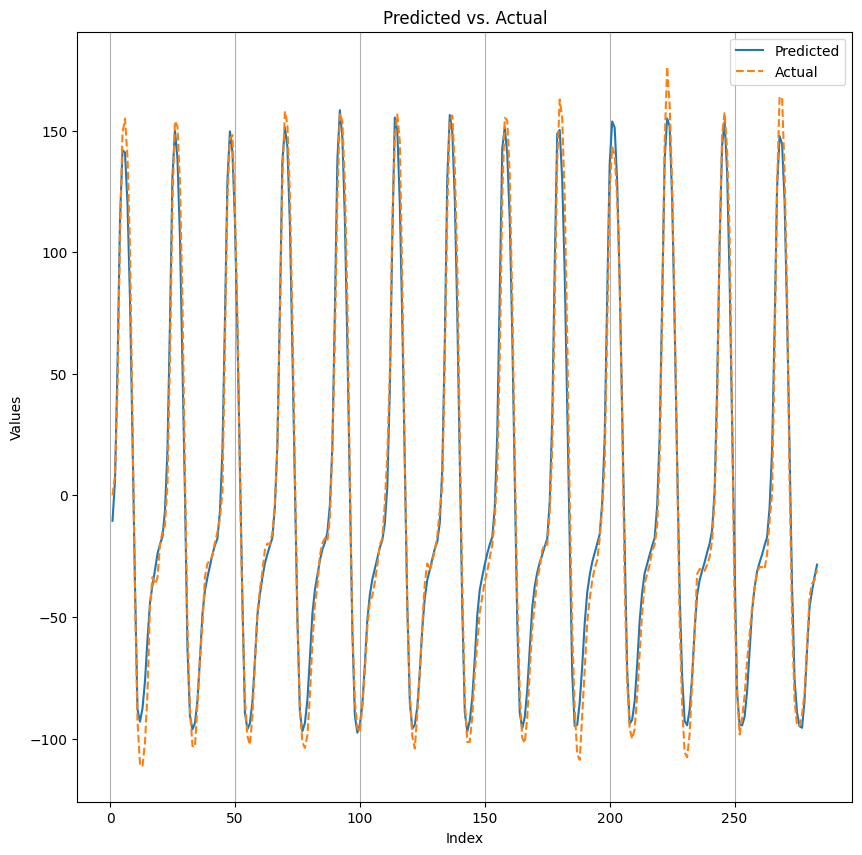

SCENE 15  TRAIN: [1975  591 1196 ... 1010 4854 4840]  TEST: [3432 3433 3434 3435 3436 3437 3438 3439 3440 3441 3442 3443 3444 3445
 3446 3447 3448 3449 3450 3451 3452 3453 3454 3455 3456 3457 3458 3459
 3460 3461 3462 3463 3464 3465 3466 3467 3468 3469 3470 3471 3472 3473
 3474 3475 3476 3477 3478 3479 3480 3481 3482 3483 3484 3485 3486 3487
 3488 3489 3490 3491 3492 3493 3494 3495 3496 3497 3498 3499 3500 3501
 3502 3503 3504 3505 3506 3507 3508 3509 3510 3511 3512 3513 3514 3515
 3516 3517 3518 3519 3520 3521 3522 3523 3524 3525 3526 3527 3528 3529
 3530 3531 3532 3533 3534 3535 3536 3537 3538 3539 3540 3541 3542 3543
 3544 3545 3546 3547 3548 3549 3550 3551 3552 3553 3554 3555 3556 3557
 3558 3559 3560 3561 3562 3563 3564 3565 3566 3567 3568 3569 3570 3571
 3572 3573 3574 3575 3576 3577 3578 3579 3580 3581 3582 3583 3584 3585
 3586 3587 3588 3589 3590 3591 3592 3593 3594 3595 3596 3597 3598 3599
 3600 3601 3602 3603 3604 3605 3606 3607 3608 3609 3610 3611 3612 3613
 3614 3615 3616 3

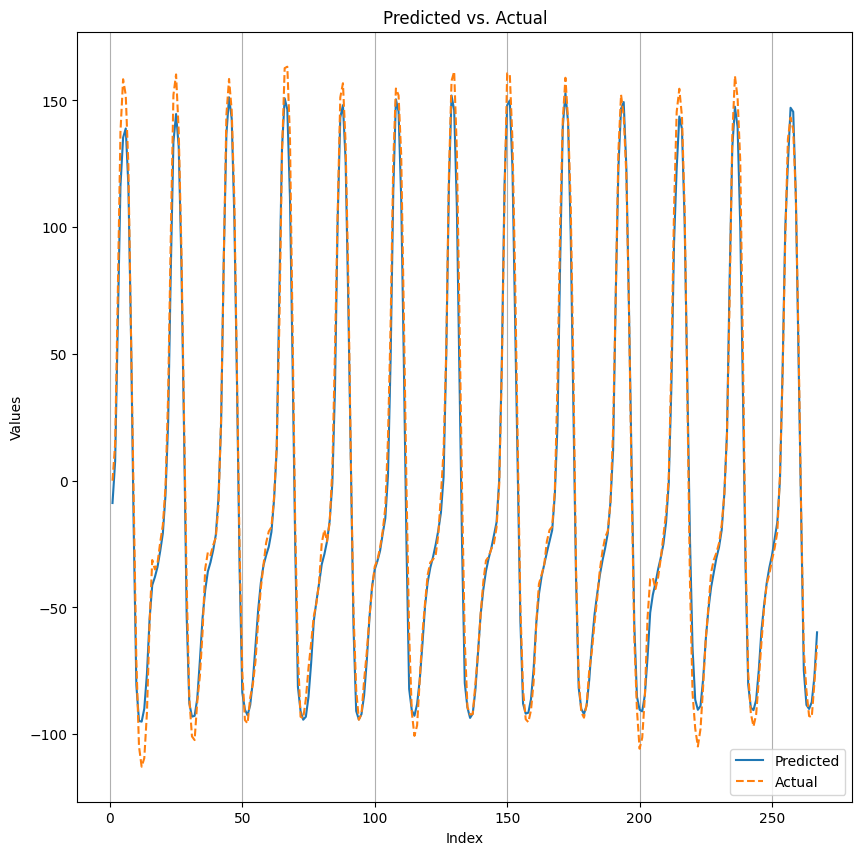

SCENE 16  TRAIN: [ 978  374  134 ... 4263 1672 4908]  TEST: [3699 3700 3701 3702 3703 3704 3705 3706 3707 3708 3709 3710 3711 3712
 3713 3714 3715 3716 3717 3718 3719 3720 3721 3722 3723 3724 3725 3726
 3727 3728 3729 3730 3731 3732 3733 3734 3735 3736 3737 3738 3739 3740
 3741 3742 3743 3744 3745 3746 3747 3748 3749 3750 3751 3752 3753 3754
 3755 3756 3757 3758 3759 3760 3761 3762 3763 3764 3765 3766 3767 3768
 3769 3770 3771 3772 3773 3774 3775 3776 3777 3778 3779 3780 3781 3782
 3783 3784 3785 3786 3787 3788 3789 3790 3791 3792 3793 3794 3795 3796
 3797 3798 3799 3800 3801 3802 3803 3804 3805 3806 3807 3808 3809 3810
 3811 3812 3813 3814 3815 3816 3817 3818 3819 3820 3821 3822 3823 3824
 3825 3826 3827 3828 3829 3830 3831 3832 3833 3834 3835 3836 3837 3838
 3839 3840 3841 3842 3843 3844 3845 3846 3847 3848 3849 3850 3851 3852
 3853 3854 3855 3856 3857 3858 3859 3860 3861 3862 3863 3864 3865 3866
 3867 3868 3869 3870 3871 3872 3873 3874 3875 3876 3877 3878 3879 3880
 3881 3882 3883 3

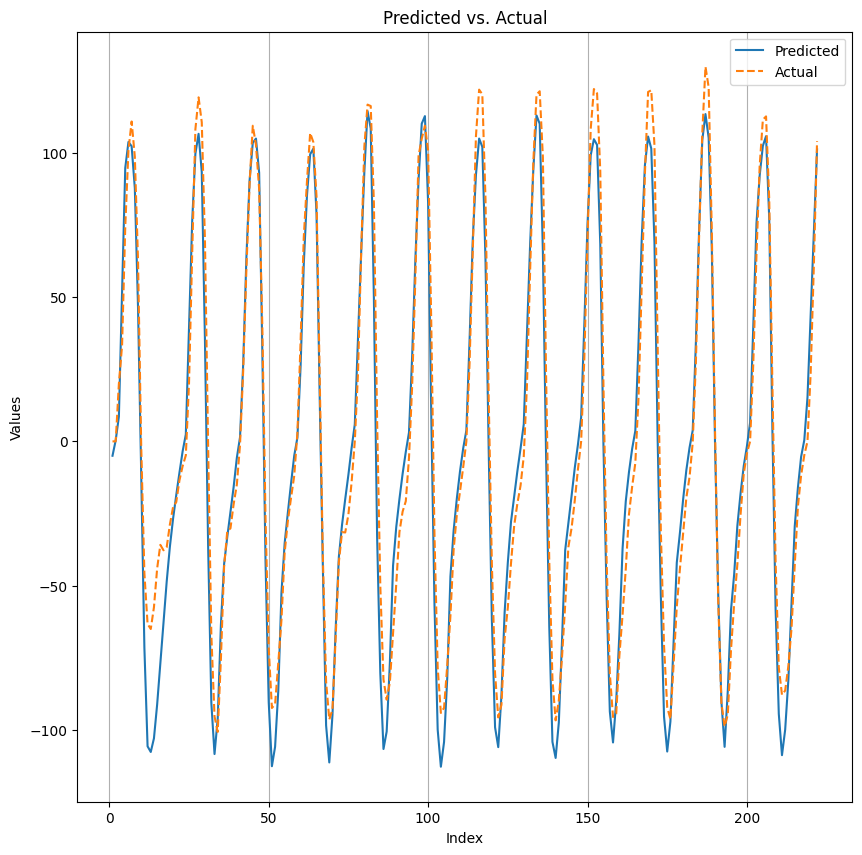

SCENE 17  TRAIN: [ 983  642 4439 ... 2543 5027 4239]  TEST: [3921 3922 3923 3924 3925 3926 3927 3928 3929 3930 3931 3932 3933 3934
 3935 3936 3937 3938 3939 3940 3941 3942 3943 3944 3945 3946 3947 3948
 3949 3950 3951 3952 3953 3954 3955 3956 3957 3958 3959 3960 3961 3962
 3963 3964 3965 3966 3967 3968 3969 3970 3971 3972 3973 3974 3975 3976
 3977 3978 3979 3980 3981 3982 3983 3984 3985 3986 3987 3988 3989 3990
 3991 3992 3993 3994 3995 3996 3997 3998 3999 4000 4001 4002 4003 4004
 4005 4006 4007 4008 4009 4010 4011 4012 4013 4014 4015 4016 4017 4018
 4019 4020 4021 4022 4023 4024 4025 4026 4027 4028 4029 4030 4031 4032
 4033 4034 4035 4036 4037 4038 4039 4040 4041 4042 4043 4044 4045 4046
 4047 4048 4049 4050 4051 4052 4053 4054 4055 4056 4057 4058 4059 4060
 4061 4062 4063 4064 4065 4066 4067 4068 4069 4070 4071 4072 4073 4074
 4075 4076 4077 4078 4079 4080 4081 4082 4083 4084 4085 4086 4087 4088
 4089 4090 4091 4092 4093 4094 4095 4096 4097 4098 4099 4100 4101 4102
 4103 4104 4105 4

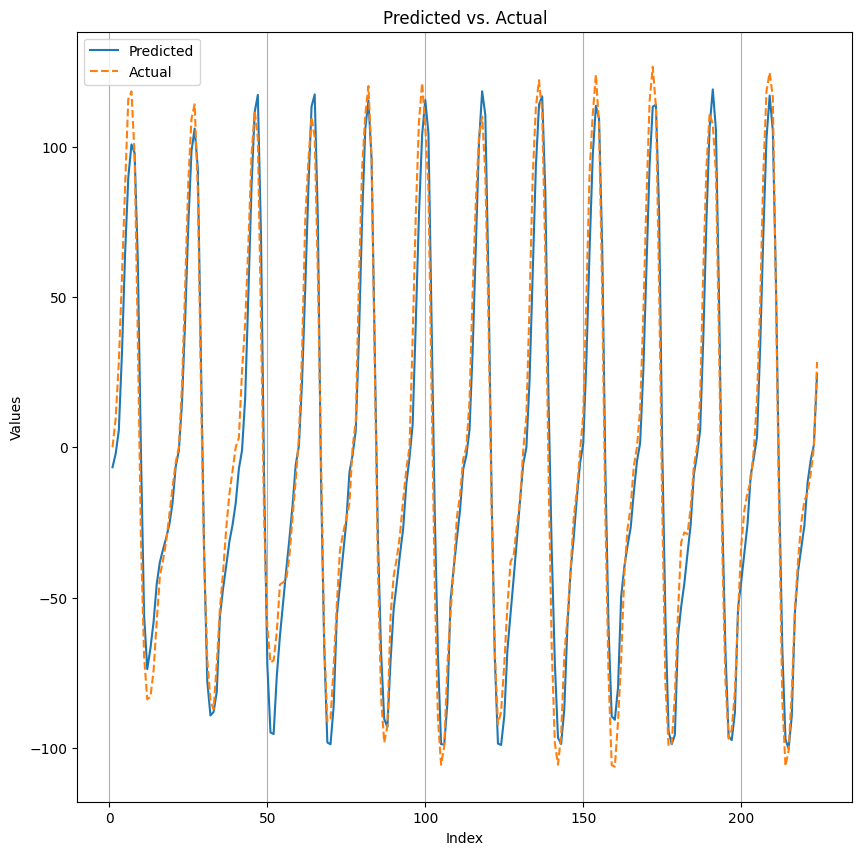

SCENE 18  TRAIN: [4541 3297 1931 ...   75 2450  183]  TEST: [4145 4146 4147 4148 4149 4150 4151 4152 4153 4154 4155 4156 4157 4158
 4159 4160 4161 4162 4163 4164 4165 4166 4167 4168 4169 4170 4171 4172
 4173 4174 4175 4176 4177 4178 4179 4180 4181 4182 4183 4184 4185 4186
 4187 4188 4189 4190 4191 4192 4193 4194 4195 4196 4197 4198 4199 4200
 4201 4202 4203 4204 4205 4206 4207 4208 4209 4210 4211 4212 4213 4214
 4215 4216 4217 4218 4219 4220 4221 4222 4223 4224 4225 4226 4227 4228
 4229 4230 4231 4232 4233 4234 4235 4236 4237 4238 4239 4240 4241 4242
 4243 4244 4245 4246 4247 4248 4249 4250 4251 4252 4253 4254 4255 4256
 4257 4258 4259 4260 4261 4262 4263 4264 4265 4266 4267 4268 4269 4270
 4271 4272 4273 4274 4275 4276 4277 4278 4279 4280 4281 4282 4283 4284
 4285 4286 4287 4288 4289 4290 4291 4292 4293 4294 4295 4296 4297 4298
 4299 4300 4301 4302 4303 4304 4305 4306 4307 4308 4309 4310 4311 4312
 4313 4314 4315 4316 4317 4318 4319 4320 4321 4322 4323 4324 4325 4326
 4327 4328 4329 4

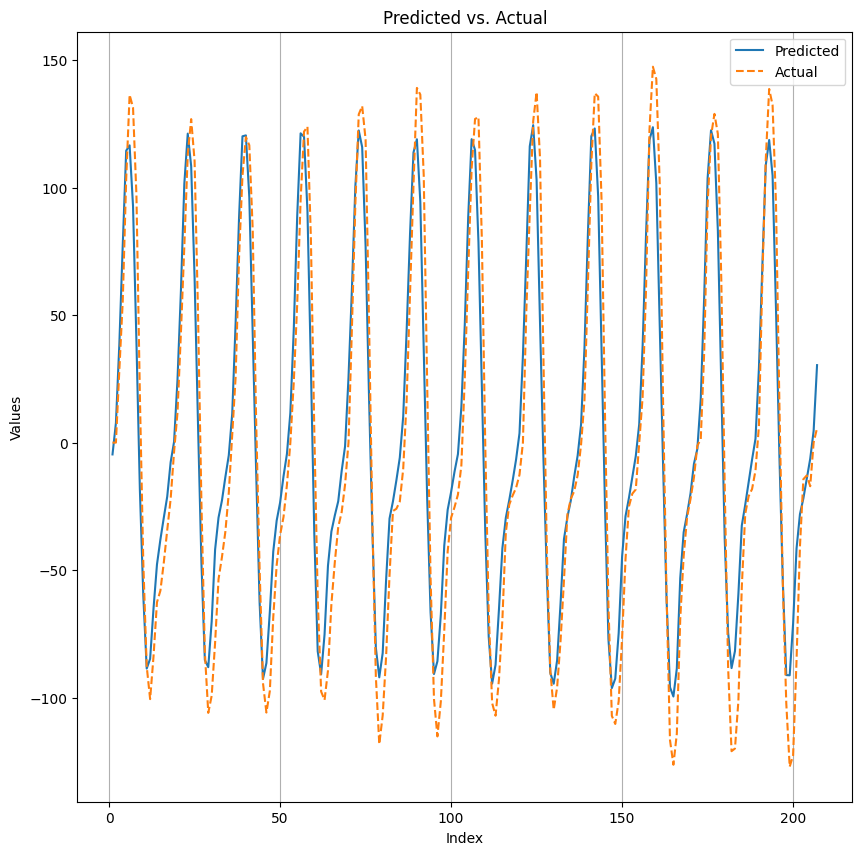

SCENE 19  TRAIN: [1504 5017 1607 ... 2468 4000 4980]  TEST: [4352 4353 4354 4355 4356 4357 4358 4359 4360 4361 4362 4363 4364 4365
 4366 4367 4368 4369 4370 4371 4372 4373 4374 4375 4376 4377 4378 4379
 4380 4381 4382 4383 4384 4385 4386 4387 4388 4389 4390 4391 4392 4393
 4394 4395 4396 4397 4398 4399 4400 4401 4402 4403 4404 4405 4406 4407
 4408 4409 4410 4411 4412 4413 4414 4415 4416 4417 4418 4419 4420 4421
 4422 4423 4424 4425 4426 4427 4428 4429 4430 4431 4432 4433 4434 4435
 4436 4437 4438 4439 4440 4441 4442 4443 4444 4445 4446 4447 4448 4449
 4450 4451 4452 4453 4454 4455 4456 4457 4458 4459 4460 4461 4462 4463
 4464 4465 4466 4467 4468 4469 4470 4471 4472 4473 4474 4475 4476 4477
 4478 4479 4480 4481 4482 4483 4484 4485 4486 4487 4488 4489 4490 4491
 4492 4493 4494 4495 4496 4497 4498 4499 4500 4501 4502 4503 4504 4505
 4506 4507 4508 4509 4510 4511 4512 4513 4514 4515 4516 4517 4518 4519
 4520 4521 4522 4523 4524 4525 4526 4527 4528 4529 4530 4531 4532 4533
 4534 4535 4536 4

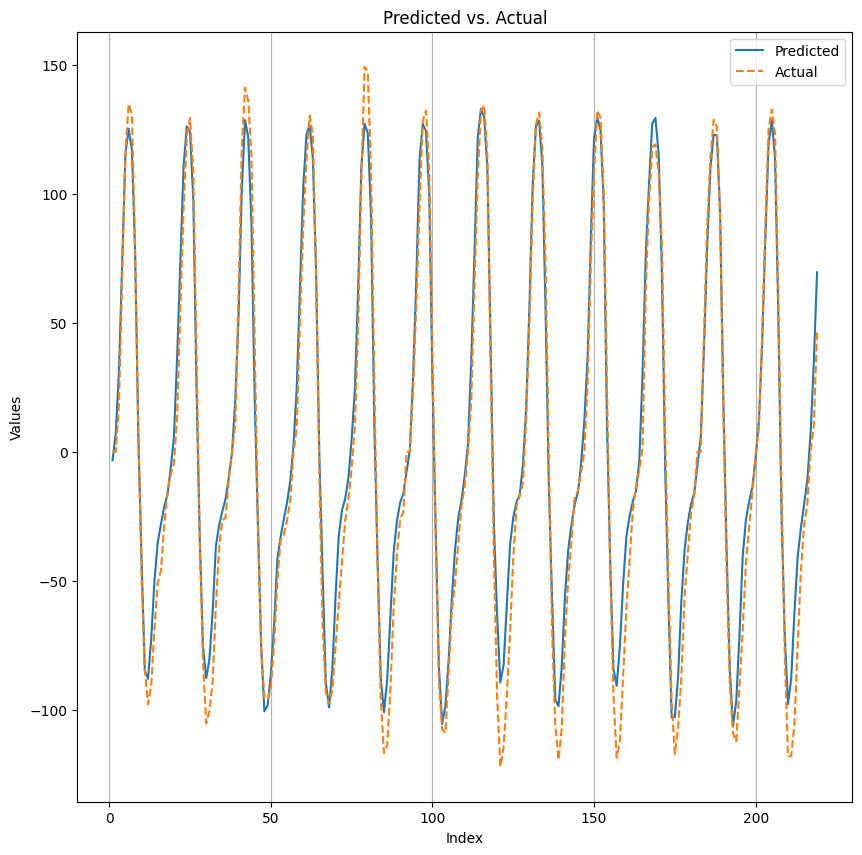

SCENE 20  TRAIN: [ 365 2194  681 ...  481  470 4042]  TEST: [4571 4572 4573 4574 4575 4576 4577 4578 4579 4580 4581 4582 4583 4584
 4585 4586 4587 4588 4589 4590 4591 4592 4593 4594 4595 4596 4597 4598
 4599 4600 4601 4602 4603 4604 4605 4606 4607 4608 4609 4610 4611 4612
 4613 4614 4615 4616 4617 4618 4619 4620 4621 4622 4623 4624 4625 4626
 4627 4628 4629 4630 4631 4632 4633 4634 4635 4636 4637 4638 4639 4640
 4641 4642 4643 4644 4645 4646 4647 4648 4649 4650 4651 4652 4653 4654
 4655 4656 4657 4658 4659 4660 4661 4662 4663 4664 4665 4666 4667 4668
 4669 4670 4671 4672 4673 4674 4675 4676 4677 4678 4679 4680 4681 4682
 4683 4684 4685 4686 4687 4688 4689 4690 4691 4692 4693 4694 4695 4696
 4697 4698 4699 4700 4701 4702 4703 4704 4705 4706 4707 4708 4709 4710
 4711 4712 4713 4714]
Epoch 1/30
309/309 [==============================] - 12s 17ms/step - loss: 0.1285 - val_loss: 0.1900
Epoch 2/30
309/309 [==============================] - 5s 16ms/step - loss: 0.0905 - val_loss: 0.1793
Epoch

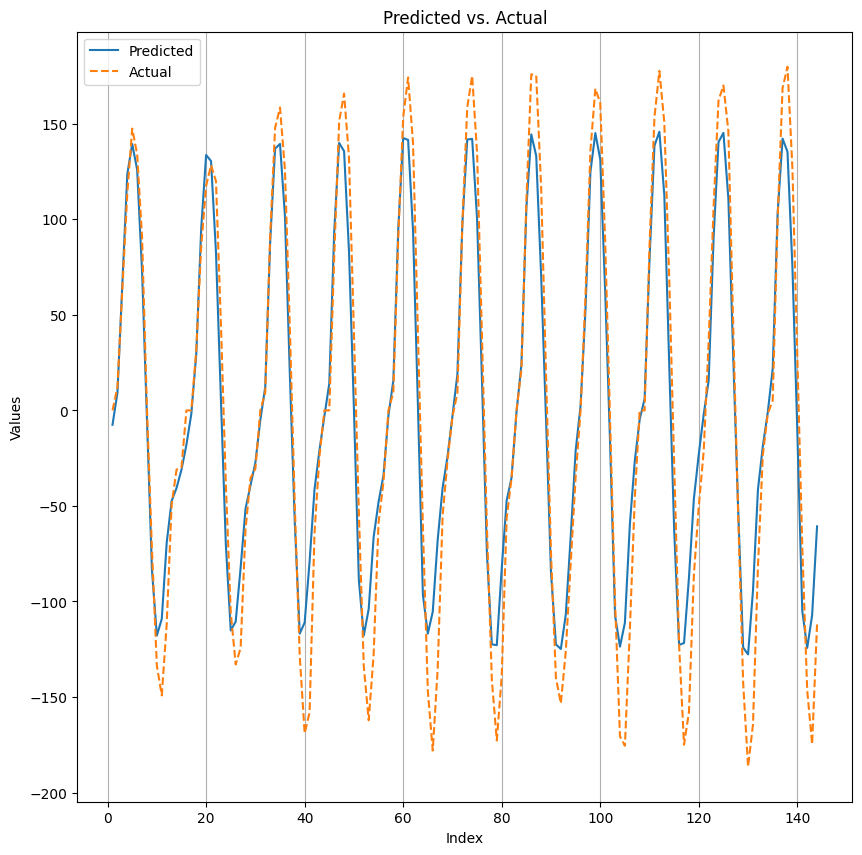

SCENE 21  TRAIN: [3946 2757  656 ... 2552  687 1364]  TEST: [4715 4716 4717 4718 4719 4720 4721 4722 4723 4724 4725 4726 4727 4728
 4729 4730 4731 4732 4733 4734 4735 4736 4737 4738 4739 4740 4741 4742
 4743 4744 4745 4746 4747 4748 4749 4750 4751 4752 4753 4754 4755 4756
 4757 4758 4759 4760 4761 4762 4763 4764 4765 4766 4767 4768 4769 4770
 4771 4772 4773 4774 4775 4776 4777 4778 4779 4780 4781 4782 4783 4784
 4785 4786 4787 4788 4789 4790 4791 4792 4793 4794 4795 4796 4797 4798
 4799 4800 4801 4802 4803 4804 4805 4806 4807 4808 4809 4810 4811 4812
 4813 4814 4815 4816 4817 4818 4819 4820 4821 4822 4823 4824 4825 4826
 4827 4828 4829 4830 4831 4832 4833 4834 4835 4836 4837 4838 4839 4840]
Epoch 1/30
310/310 [==============================] - 13s 20ms/step - loss: 0.1062 - val_loss: 0.1113
Epoch 2/30
310/310 [==============================] - 5s 15ms/step - loss: 0.0627 - val_loss: 0.0780
Epoch 3/30
310/310 [==============================] - 4s 14ms/step - loss: 0.0536 - val_loss: 0.0

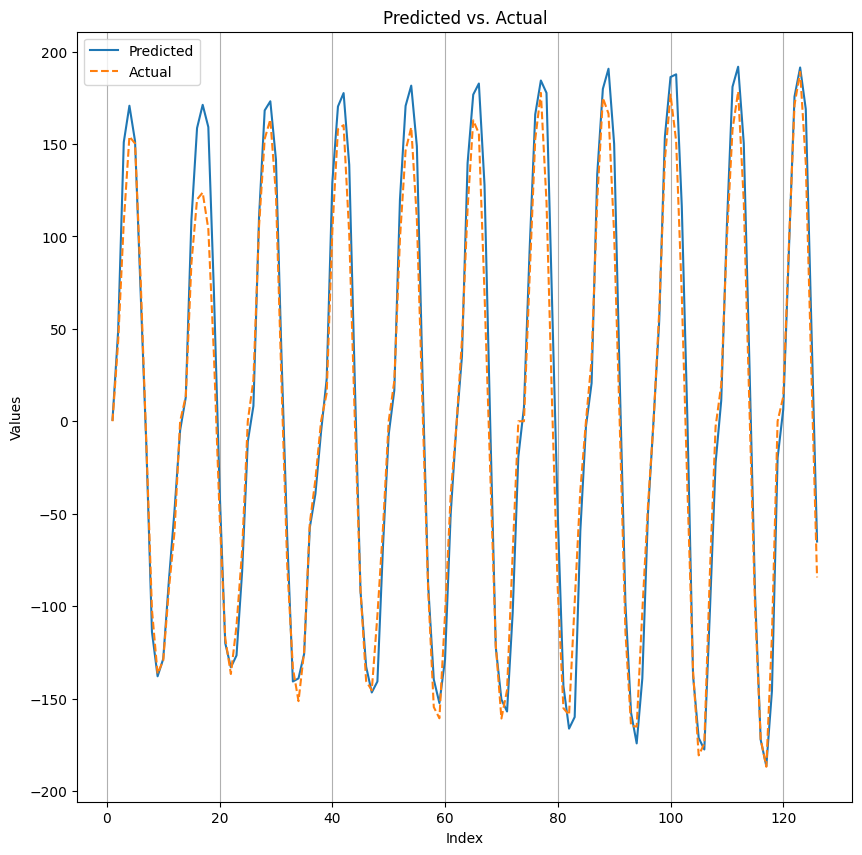

SCENE 22  TRAIN: [4148 3945  594 ... 1179 2232 3431]  TEST: [4841 4842 4843 4844 4845 4846 4847 4848 4849 4850 4851 4852 4853 4854
 4855 4856 4857 4858 4859 4860 4861 4862 4863 4864 4865 4866 4867 4868
 4869 4870 4871 4872 4873 4874 4875 4876 4877 4878 4879 4880 4881 4882
 4883 4884 4885 4886 4887 4888 4889 4890 4891 4892 4893 4894 4895 4896
 4897 4898 4899 4900 4901 4902 4903 4904 4905 4906 4907 4908 4909 4910
 4911 4912 4913 4914 4915 4916 4917 4918 4919 4920 4921 4922 4923 4924
 4925 4926 4927 4928 4929 4930 4931 4932 4933 4934 4935 4936 4937 4938
 4939 4940 4941 4942 4943 4944 4945 4946 4947 4948 4949 4950 4951 4952
 4953 4954 4955 4956 4957 4958 4959 4960 4961 4962 4963]
Epoch 1/30
311/311 [==============================] - 13s 19ms/step - loss: 0.1400 - val_loss: 0.2611
Epoch 2/30
311/311 [==============================] - 5s 17ms/step - loss: 0.0840 - val_loss: 0.1268
Epoch 3/30
311/311 [==============================] - 4s 14ms/step - loss: 0.0579 - val_loss: 0.1111
Epoch 4/30


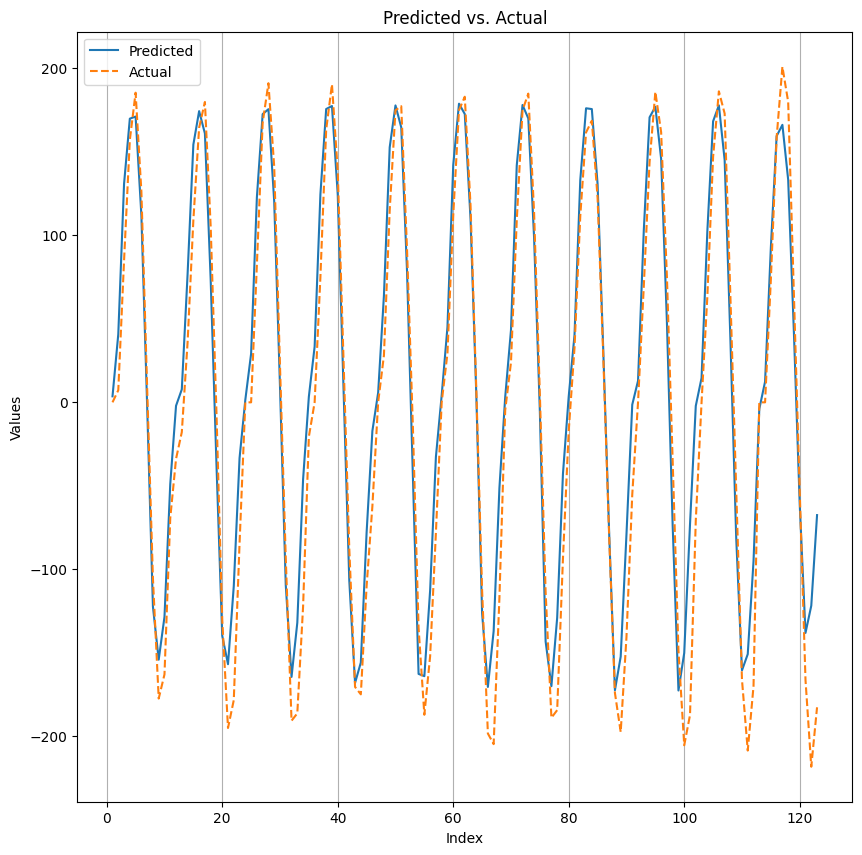

SCENE 23  TRAIN: [3043 2795 4644 ... 1188 1788 3007]  TEST: [4964 4965 4966 4967 4968 4969 4970 4971 4972 4973 4974 4975 4976 4977
 4978 4979 4980 4981 4982 4983 4984 4985 4986 4987 4988 4989 4990 4991
 4992 4993 4994 4995 4996 4997 4998 4999 5000 5001 5002 5003 5004 5005
 5006 5007 5008 5009 5010 5011 5012 5013 5014 5015 5016 5017 5018 5019
 5020 5021 5022 5023 5024 5025 5026 5027 5028 5029 5030 5031 5032 5033
 5034 5035 5036 5037 5038 5039 5040 5041 5042 5043 5044 5045 5046 5047
 5048 5049 5050 5051 5052 5053 5054 5055 5056 5057 5058 5059 5060 5061
 5062 5063 5064 5065 5066 5067 5068 5069 5070 5071 5072 5073 5074 5075
 5076 5077 5078 5079 5080 5081 5082 5083]
Epoch 1/30
311/311 [==============================] - 13s 19ms/step - loss: 0.1195 - val_loss: 0.1961
Epoch 2/30
311/311 [==============================] - 4s 13ms/step - loss: 0.0708 - val_loss: 0.1356
Epoch 3/30
311/311 [==============================] - 4s 13ms/step - loss: 0.0543 - val_loss: 0.1030
Epoch 4/30
311/311 [======

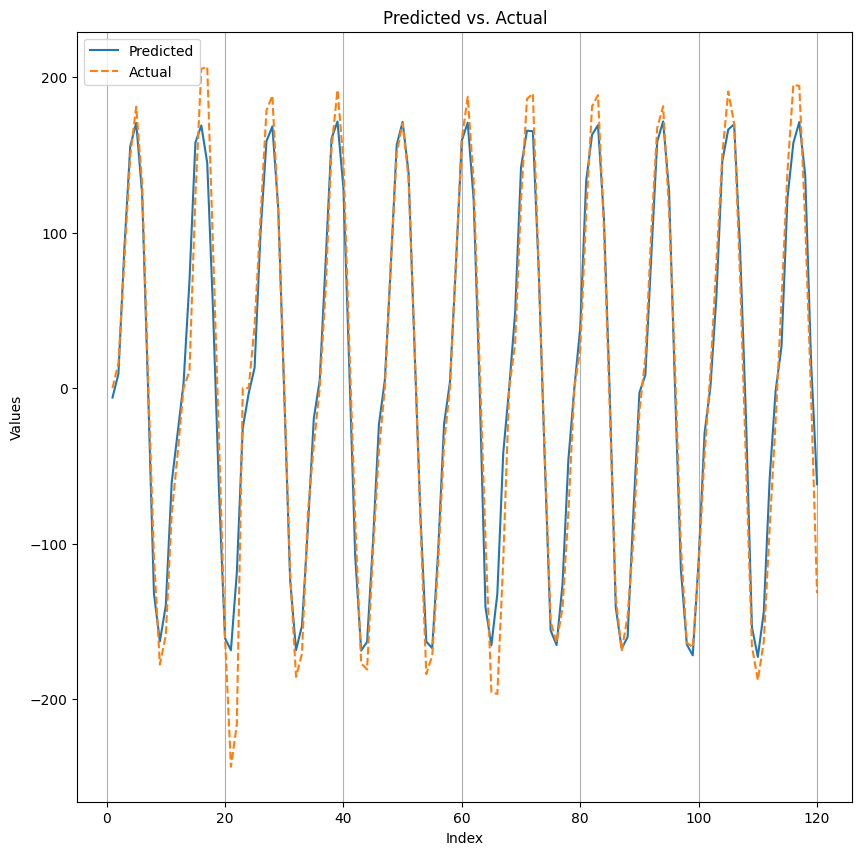

In [14]:
ResultadosRegressao(Resultados3Matrix[0],Resultados3Matrix[1],Resultados3Matrix[5])